# PROJECT OVERVIEW

## PROJECT GOAL:


* **Use President Trump's tweets (NLP and other features) to predict fluctuations in the stock market (using S&P 500 as index).**

    
### DATA USED:

* **All Donald Trump tweets from inaugaration day 2017 to today (for now) - 06/20/19**

    *          Extracted from http://www.trumptwitterarchive.com/
*     **Minute-resolution data for the S&P500 covering the same time period.**

    *         IVE S&P500 Index from - http://www.kibot.com/free_historical_data.aspx
    
### MAJOR REFERENCES / INSPIRATION / PRIOR WORK IN FIELD:

1. **Stanford Scientific Poster Using NLP ALONE to predict if stock prices increase or decrease 5 mins after Trump tweets.**  [Poster PDF LINK](http://cs229.stanford.edu/proj2017/final-posters/5140843.pdf)
    - [Evernote Summary Notes Link](https://www.evernote.com/l/AAoL1CyhPV1GoIzSgq59GO10x6xfEeVDo5s/)

2. **TowardsDataScience Blog Plost on "Using the latest advancements in deep learning to predict stock price movements."** [Blog Post link](https://towardsdatascience.com/aifortrading-2edd6fac689d)
    - [Evernote Summary](https://www.evernote.com/l/AApvQ8Xh8b9GBLhrD0m8w4H1ih1oVM8wkEw/)


### OUTLINE FOR DATA TO PRODUCE & MODEL FOR FINAL PROJECT:

#### TWITTER DATA:

* [ENGINEER FEATURES] **Extract features from Trump's tweets: perform the NLP analysis to generate the features about his tweets to use in final model**

    * [x] Tweet sentiment score
    * [ ] Tweet frequency per timebin
    * [x] upper-to-lowercase-ratio
    * [x] retweet-count
    * [x] favorite-count
    
* [PREDICTIVE MODEL] **Generate Binary Stock Market Predictions based on Trump's Tweets.**

    * [x] Create a neural network model like the Stanford guys, where my model JUST uses the content of trump's tweets with word embeddings and a binary label (-1, 0,1) for direction of stock market change at a fixed time delta (they did 5 mins, I will do 1 hour) [ See reference #1 - stanford poster]
  



#### STOCK MARKET DATA (S&P 500):

* [ENGINEER FEATURES] **Extract features about the stock data -calculate the technical indices for the S&P 500 discussed in his article.**  [ see reference #2 - blog post ]

    * [x] 7 days moving average 
    * [x]  21 days moving average
    * [x] exponential moving average
    * [x] momentum
    * [x] Bollinger bands
    * [x] MACD
    * (Maybe) FFT / time series decomp for trend lines
    
* [PREDICTIVE MODEL] **Generate stock price predictions based only historical data using....**

    * [x] a SARIMA model[?]
    * [ ] a FB Prophet model[?] 
    * [x] an LSTM neural network like other blog post?  [!!!] [Predicting the Stock Market Using Machine Learning and Deep Learning](https://www.evernote.com/l/AAq1azRmt2dANq_Oye-MBZQr-OU5lA5APl8/)
    
#### FINAL MODEL - FEED ALL ABOVE FEATURES INTO:

- **Plan A: NEURAL NETWORK *REGRESSION* MODEL TO PREDICT *ACTUAL S&P 500 PRICE* AT 1 HOUR-1 DAY FOLLOWING TWEETS**
    - Final Model Target is based more on blog post's construction (ref#2), but takes output of model like ref#1
<img src="https://raw.githubusercontent.com/jirvingphd/dsc-5-capstone-project-online-ds-ft-021119/master/figures/annotated_GAN_for_stock_market.jpeg" width=600>
- ~~PLAN B: NEURAL NETWORK *BINARY CLASSIFICATION*  MODEL TO PREDICT THE *DIRECTION OF CHANGE FOR S&P 500 PRICE* AT 1 HOUR - 1 DAY FOLLOWING TWEETS~~
    - ~~Final Model Target is based on stanford poster's methods/goal. (ref #1)~~    

    





## DATA ANALYSIS DETAILS AND Equations/Code 

### Technical Indicators - Explanation & Equations






1. **7 and 21 day moving averages**
```python
df['ma7'] df['price'].rolling(window = 7 ).mean() #window of 7 if daily data
df['ma21'] df['price'].rolling(window = 21).mean() #window of 21 if daily data
```    
2. **MACD(Moving Average Convergence Divergence)**

> Moving Average Convergence Divergence (MACD) is a trend-following momentumindicator that shows the relationship between two moving averages of a security’s price. The MACD is calculated by subtracting the 26-period Exponential Moving Average (EMA) from the 12-period EMA.

>The result of that calculation is the MACD line. A nine-day EMA of the MACD, called the "signal line," is then plotted on top of the MACD line, which can function as a trigger for buy and sell signals. 

> Traders may buy the security when the MACD crosses above its signal line and sell - or short - the security when the MACD crosses below the signal line. Moving Average Convergence Divergence (MACD) indicators can be interpreted in several ways, but the more common methods are crossovers, divergences, and rapid rises/falls.  - _[from Investopedia](https://www.investopedia.com/terms/m/macd.asp)_

```python
df['ewma26'] = pd.ewma(df['price'], span=26)
df['ewma12'] = pd.ewma(df['price'], span=12)
df['MACD'] = (df['12ema']-df['26ema'])
```
3. **Exponentially weighted moving average**
```python
dataset['ema'] = dataset['price'].ewm(com=0.5).mean()
```

4. **Bollinger bands**
    > "Bollinger Bands® are a popular technical indicators used by traders in all markets, including stocks, futures and currencies. There are a number of uses for Bollinger Bands®, including determining overbought and oversold levels, as a trend following tool, and monitoring for breakouts. There are also some pitfalls of the indicators. In this article, we will address all these areas."
> Bollinger bands are composed of three lines. One of the more common calculations of Bollinger Bands uses a 20-day simple moving average (SMA) for the middle band. The upper band is calculated by taking the middle band and adding twice the daily standard deviation, the lower band is the same but subtracts twice the daily std. - _[from Investopedia](https://www.investopedia.com/trading/using-bollinger-bands-to-gauge-trends/)_

    - Boilinger Upper Band:<br>
    $BOLU = MA(TP, n) + m * \sigma[TP, n ]$<br><br>
    - Boilinger Lower Band<br>
    $ BOLD = MA(TP,n) - m * \sigma[TP, n ]$
    - Where:
        - $MA$  = moving average
        - $TP$ (typical price) = $(High + Low+Close)/ 3$
        - $n$ is number of days in smoothing period
        - $m$ is the number of standard deviations
        - $\sigma[TP, n]$ = Standard Deviations over last $n$ periods of $TP$

```python
# Create Bollinger Bands
dataset['20sd'] = pd.stats.moments.rolling_std(dataset['price'],20)
dataset['upper_band'] = dataset['ma21'] + (dataset['20sd']*2)
dataset['lower_band'] = dataset['ma21'] - (dataset['20sd']*2)
```


5. **Momentum**
> "Momentum is the rate of acceleration of a security's price or volume – that is, the speed at which the price is changing. Simply put, it refers to the rate of change on price movements for a particular asset and is usually defined as a rate. In technical analysis, momentum is considered an oscillator and is used to help identify trend lines." - _[from Investopedia](https://www.investopedia.com/articles/technical/081501.asp)_

    - $ Momentum = V - V_x$
    - Where:
        - $V$ = Latest Price
        - $V_x$ = Closing Price
        - $x$ = number of days ago

```python
# Create Momentum
dataset['momentum'] = dataset['price']-1
```



# LOAD & PROCESS RAW STOCK DATA

In [1]:
## IMPORT PACKAGES
from bs_ds.imports import *
import functions_combined_BEST as ji
import my_keras_functions as jik

# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload

# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()

# Reload modules in case files have been updated
reload(jik)
reload(ji)

# Suppress warnings
ji.quiet_mode()

bs_ds  v0.8.9 loaded.  Read the docs: https://bs-ds.readthedocs.io/en/latest/index.html
For convenient loading of standard modules use: from bs_ds.imports import *



Package,Handle,Description
bs_ds,bs,Custom data science bootcamp student package
matplotlib,mpl,Matplotlib's base OOP module with formatting artists
matplotlib.pyplot,plt,Matplotlib's matlab-like plotting module
numpy,np,scientific computing with Python
pandas,pd,High performance data structures and tools
seaborn,sns,High-level data visualization library based on matplotlib


"import warnings\nwarnings.filterwarnings('ignore')\nimport os\nos.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'"

In [2]:
# DISPLAY CODE TO BE USED BELOW TO LOAD AND PROCESS STOCK DATA
functions_used=['ji.load_processed_stock_data', # This script combines the oriignal 4 used:
                'ji.load_raw_stock_data_from_txt',
                'ji.set_timeindex_freq','ji.custom_BH_freq',
               'ji.get_technical_indicators']

ji.ihelp_menu(functions_used)

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

In [3]:
# Load stock_df data from functions detailed above

"""NOTE: current processed filename ready for modeling is: processed_datafile"""
processed_datafile = '_stock_df_with_technical_indicators.csv'

# LOAD IN FULL STOCK DATASET 
full_df = ji.load_processed_stock_data()

# SELECT DESIRED COLUMNS
stock_df = full_df[[
    'price','ma7','ma21','26ema','12ema','MACD',
    '20sd','upper_band','lower_band','ema','momentum','filled_timebin'
]].copy()

# print(stock_df.index.freq)
display(stock_df.head(3))
fig = ji.plotly_time_series(stock_df['price'])

>> File found. Loading _stock_df_with_technical_indicators.csv
DatetimeIndex(['2016-12-29 15:30:00', '2019-06-21 15:30:00'], dtype='datetime64[ns]', name='date_time_index', freq=None) <CustomBusinessHour: CBH=09:30-16:30>


,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,filled_timebin
date_time_index,,,,,,,,,,,,
2016-12-29 15:30:00,96.27,96.864898,96.277007,96.573856,96.730494,0.156639,1.002051,98.281110,94.272904,96.263988,89.27,False
2016-12-30 09:30:00,96.38,96.850204,96.293537,96.571218,96.721997,0.150779,0.980655,98.254848,94.332227,96.341329,89.38,False
2016-12-30 10:30:00,96.21,96.831633,96.307891,96.566317,96.709593,0.143275,0.959724,98.227340,94.388442,96.253776,89.21,False


In [4]:
# import plotly
# import cufflinks as cf
# cf.go_offline()
# my_layout = ji.def_my_layout_solar_theme()
# ji.display_dict_dropdown(my_layout)

In [5]:
fig = ji.plotly_time_series(stock_df.drop(['20sd','MACD'],axis=1))

In [6]:
# Plot technical indicators to be used
ji.plotly_technical_indicators(stock_df)

In [7]:
# ## SAVE FULL CSV WITH TECH INDICATORS
# def save_df_to_csv_ask_to_overwrite(stock_df, filename = '_stock_df_with_technical_indicators.csv',):
#     import os
#     current_files = os.listdir()

#     processed_data_filename = filename#'_stock_df_with_technical_indicators.csv'

#     # check if csv already exists
#     if processed_data_filename not in current_files:

#         stock_df.to_csv(processed_data_filename)

#     # Ask the user to overwrite existing file
#     else:

#         print('File already exists.')
#         check = input('Overwrite?(y/n):')

#         if check.lower() == 'y':
#             stock_df.to_csv(processed_data_filename)
#             print(f'File {processed_data_filename} was saved.')
    
#         else:
#             print('No file was saved.')
            
# # save_df_to_csv_ask_to_overwrite(stock_df,'stock_df_for_modeling.csv')

## Checking for Stationarity and Trends

In [8]:
fun_used=['stationarity_check', 'adf_test']
ihelp_menu(fun_used)

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

C:\Users\james\Anaconda3\envs\learn-env-ext\lib\site-packages\pandas\plotting\_converter.py:129: FutureWarning:

Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()



Results of Dickey-Fuller Test:
	If p<.05 then timeseries IS stationary.
Test Statistic                   -1.824991
p-value                           0.368127
#Lags Used                       32.000000
Number of Observations Used    4490.000000
Critical Value (1%)              -3.431807
Critical Value (5%)              -2.862184
Critical Value (10%)             -2.567113
dtype: float64


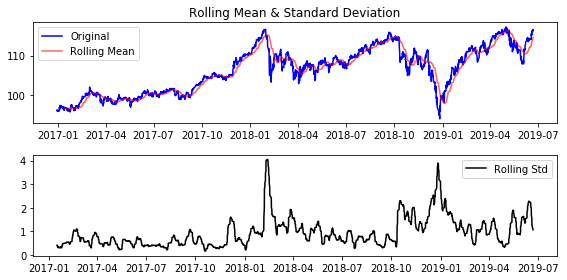

In [9]:
# Check if stationary
ji.stationarity_check(stock_df, col='price',freq=ji.custom_BH_freq())

In [10]:
ji.adf_test(stock_df['price'], title='Price')

Augmented Dickey-Fuller Test: Price
ADF test statistic        -1.824991
p-value                    0.368127
# lags used               32.000000
# observations          4490.000000
critical value (1%)       -3.431807
critical value (5%)       -2.862184
critical value (10%)      -2.567113
Weak evidence against the null hypothesis
Fail to reject the null hypothesis
Data has a unit root and is non-stationary


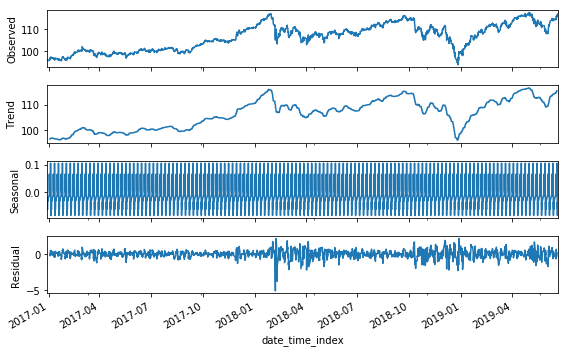

In [11]:
# Adding a seasonal decomposition
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(stock_df['price'], freq=35)#, freq=custom_BH_freq())

with plt.rc_context({'figure.figsize': (8,5)}):
    result.plot();

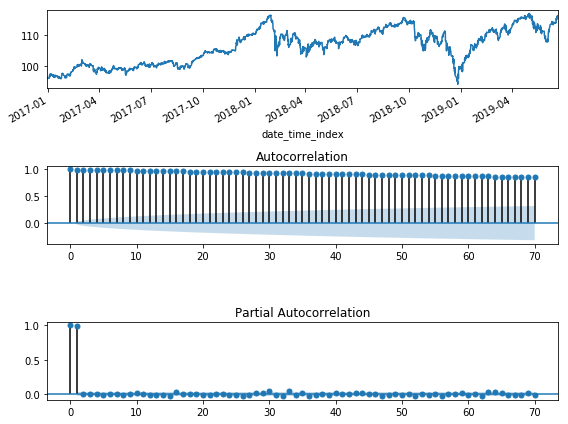

In [12]:
from statsmodels.graphics.tsaplots import plot_acf,plot_pacf
plot_df = stock_df['price']

# Create subplots 
fig,ax = plt.subplots(nrows=3,ncols=1,figsize=(8,6))
plot_df.plot(ax=ax[0])

# Plot acf and pacf
num_lags = 70
plot_acf(plot_df,ax=ax[1] , lags=num_lags);
plot_pacf(plot_df,ax=ax[2],lags=num_lags);
plt.tight_layout()

# INITIAL MODEL 


## Pyramind ARIMA GridSearch 
#### **Using `pmdarima` to grid search for best ARIMA model type and orders**

- Using `auto_arima` from `pmdarima`

- SARIMA involves multiple sets of hyperparameters:
    - For base model: a set of p,d,q parameters
    - For seasonal model:a set of P,D,Q for the seasonal components.
    - m = the number of time periods to include in the season 
    
- Set start and max values for each parameter
    - i.e. `start_p=0, max_p = 10`
- For seasonal data, setting `m` indicates how many periods should be considered part of the season.


- **Below is from ["Predicitng the Sotck Market Using Machine Learning and Deep Learning."](https://www.analyticsvidhya.com/blog/2018/10/predicting-stock-price-machine-learningnd-deep-learning-techniques-python/):**
> Below are the steps you should follow for implementing auto ARIMA:
    1. Load the data: This step will be the same. Load the data into your notebook
    2. Preprocessing data: The input should be univariate, hence drop the other columns
    3. Fit Auto ARIMA: Fit the model on the univariate series
    4. Predict values on validation set: Make predictions on the validation set
    5. Calculate RMSE: Check the performance of the model using the predicted values against the actual values

In [13]:
skip=True
if skip==False:
    from pmdarima.arima import auto_arima

    model = auto_arima(train_data['price'], start_p=1, start_q=1, D=1, max_p=4,max_q=4,trace=True,seasonal=True,m=35)
    model.summary()

___
**Results of the Auto-Arima searching with training data set:**
- Training Set= all data less the last 90 days:

`Model:		SARIMAX(0, 1, 0)x(1, 0, 1, 35)	`
- So what is this really saying?
    - p,d,q = (0,1,0)
        - AR (p) = 0
        - Difference=1
        - MA order(q)=0 
        
    - P,D,Q,m = (1,0,1,35)
        - Seasonal AR(P) = 1
        - Seasonal Differencing =0
        - Seasonal MA(Q)
        - Steps per season (m) = 35 (set by user)

`statsmodels` version of SARIMA called SARIMAX adds an eXogenous variable to the regression.
- Read this: https://www.analyticsvidhya.com/blog/2018/08/auto-arima-time-series-modeling-python-r/


- WHEN I SWITCH TO DAILY DATA:
`Model:	SARIMAX(1, 1, 1)x(1, 0, 1, 5)`

#### First try a SARIMA model before SARIMAX

-

In [14]:
skip=True
if skip==False:
    from statsmodels.tsa.statespace.sarimax import SARIMAX
    # SARIMAX(0, 1, 0)x(1, 0, 1, 35)	
    # Fit ARIMA: order=(1, 0, 0) seasonal_order=(1, 1, 0, 35); AIC=2881.238, BIC=2905.991, Fit time=52.449 seconds
    model = SARIMAX(train_data['price'], order= (1,1,0),seasonal_order=(0,1,1,35), enforce_invertibility=False ) 
    results=model.fit()
    results.summary()

In [15]:
skip=True
if skip==False:
    # evaluate model
    from sklearn.metrics import mean_absolute_error, mean_squared_error
    start = len(train_data)
    end = len(train_data) + len(test_data) - 1
    predictions = results.predict(start=start,end=end).rename('SARIMA Model')
    days_per_period=7

    # Combine preds and true into one df
    df_predictions_sarima = pd.concat([test_data['price'],pd.Series(predictions, index=test_data.index,name='predicted_price')],axis=1)
    df_predictions_sarima.dropna(inplace=True)
    display(df_predictions_sarima.head())

    # calculate rmse
    rmse_sarima = np.sqrt(mean_squared_error(df_predictions_sarima['price'],df_predictions_sarima['predicted_price']))
    print(f"RMSE: {rmse_sarima.round(3)}")

    # Plot results
    plt.plot(train_data['price'].iloc[-120*days_per_period:], label='Training Price')#.plot(label='price - train')
    plt.plot(df_predictions_sarima['price'], label='True Price')
    plt.plot(df_predictions_sarima['predicted_price'], label='Predicted Price')
    plt.ylabel('Stock Price')
    plt.xlabel('Business Day - Hour Resolution')
    plt.title('SARIMA Model')
    plt.legend()
    plt.tight_layout()
    plt.text('2018-10-01',113,f"RMSE: {rmse_sarima.round(3)}", fontdict={'fontsize':10, 'fontweight':'medium'})

# Data Prep/Split Forecasting Stock Market Data
- https://www.evernote.com/l/AApgV1EaL9lEYpujWnwHq62W9QyEKkH4hwA/

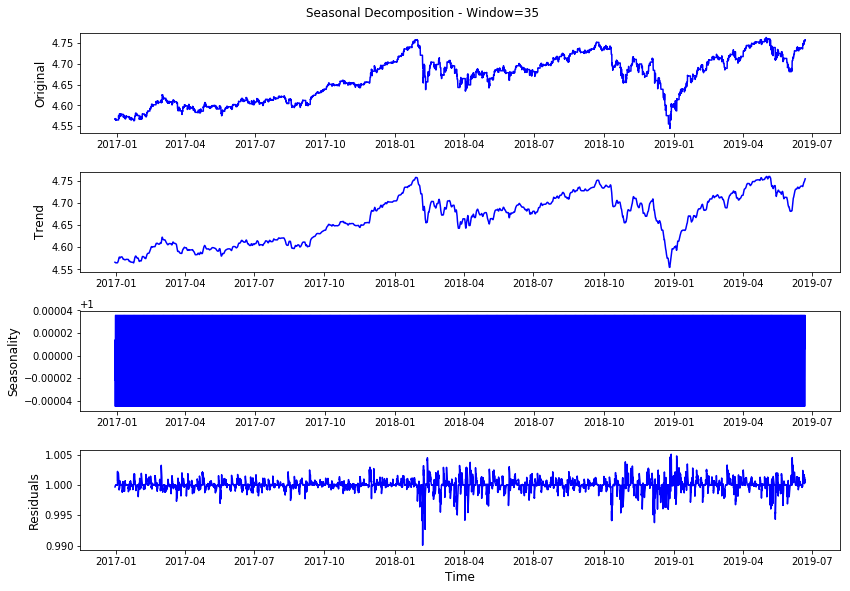

In [16]:
stock_df_decomposed = ji.seasonal_decompose_and_plot(stock_df, col='price', window=35);
# stock_df_decomposed.plot();
# plt.xlim(['2019-01-01','2019-06-01'])

# KERAS MODELING

## Model 1: LSTM using `price` alone

In [17]:
# Display help menu for functions used above
ji.ihelp_menu(function_names=['ji.def_data_params',
              'ji.train_test_split_by_last_days',
              'ji.make_scaler_library',
              'ji.transform_cols_from_library'])

interactive(children=(Checkbox(value=False, description='show_help'), Checkbox(value=True, description='show_s…

In [67]:
## IMPORT PACKAGES
from bs_ds.imports import *
import functions_combined_BEST as ji
import my_keras_functions as jik

# Import some functions directly
from functions_combined_BEST import ihelp, ihelp_menu, reload

# Import plotly and cufflinks for iplots
import plotly
import cufflinks as cf
cf.go_offline()

# Reload modules in case files have been updated
reload(jik)
reload(ji)

# Suppress warnings
ji.quiet_mode()
reload(jik)
reload(ji)

<module 'functions_combined_BEST' from 'D:\\Users\\James\\Dropbox (Personal)\\CODING\\_FLATIRON\\Mod5_FinalProject\\dsc-5-capstone-project-online-ds-ft-021119\\functions_combined_BEST.py'>

In [132]:
## Define data parameters for train_test_split 
model_params={}
model_params['data_params'] = ji.def_data_params(stock_df,
                                                 num_test_days=10, num_train_days=365, 
                                                 days_for_x_window=2, verbose=0)

###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
dp = model_params['data_params']
df_train, df_test = ji.train_test_split_by_last_days(stock_df,
                                                     periods_per_day = dp['periods_per_day'], 
                                                     num_test_days   =  dp['num_test_days'],
                                                     num_train_days  =  dp['num_train_days'],
                                                     verbose=0, iplot=False)

display(df_train.head(2).style.set_caption('df_train - pre-scaling'))
# ji.display_dict_dropdown(model_params)

###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
scaler_library, df_train, model_params = ji.make_scaler_library(df_train, 
                                                                transform=True,
                                                                model_params=model_params,
                                                                verbose=2)

df_test = ji.transform_cols_from_library(df_test,col_list=None,col_scaler_dict=scaler_library,
                                                      scaler_library=scaler_library,inverse=False)

# Show transformed dataset
display( df_train.head(2).round(3).style.set_caption('training data - scaled'))#,
#         df_test.head(2).round(3).style.set_caption('test data'))

# Create timeseries generators
train_generator, test_generator, model_params =\
    ji.make_train_test_series_gens( df_train['price'], df_test['price'],
                                   n_features=1,batch_size=1, model_params=model_params,
                                   verbose=0)

ji.display_dict_dropdown(model_params)

,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,filled_timebin
date_time_index,,,,,,,,,,,,
2018-01-15 09:30:00,114,112.6,111,110.7,112,1.33,1.187,113.4,108.7,114,107,True
2018-01-15 10:30:00,114,112.6,111.1,110.7,112.1,1.34,1.209,113.5,108.7,114,107,True


These columns were excluded due to incompatible dtypes.
['filled_timebin']



,price,ma7,ma21,26ema,12ema,MACD,20sd,upper_band,lower_band,ema,momentum,filled_timebin
date_time_index,,,,,,,,,,,,
2018-01-15 09:30:00,0.861,0.805,0.7,0.668,0.755,0.919,0.173,0.551,0.726,0.86,0.861,True
2018-01-15 10:30:00,0.861,0.808,0.702,0.671,0.758,0.921,0.177,0.556,0.725,0.86,0.861,True


------------ Dictionary Contents ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

In [133]:
# # ji.display_dict_dropdown(model_params)
# funcs_make_model = ['make_train_test_series_gens','def_callbacks_and_params',
#                   'def_compile_params_optimizer','make_model1'] 
# ihelp_menu(funcs_make_model)

In [134]:
def _def_callbacks_and_params_(model_params=None,loss_function='my_rmse',checkpoint_mode='min',filepath=None,
                             stop_mode='min',patience=1,min_delta=.001,verbose=1):
    import functions_combined_BEST as ji
    

            ########## Define loss function and callback params ##########
    callback_params ={}
    callback_params['custom_loss_function'] = loss_function
    callback_params['ModelCheckpoint'] = {'monitor': loss_function, 'mode':checkpoint_mode}
    callback_params['EarlyStopping'] = {'monitor':loss_function, 'mode':stop_mode, 
                                        'patience':patience, 'min_delta':min_delta}

    # CREATING CALLBACKS
    from keras import callbacks

    if filepath is None:
        filepath = f"models/checkpoints/model1_weights_{ji.auto_filename_time(prefix=None)}.hdf5"

    if 'my_rmse' in loss_function:
        import functions_combined_BEST as ji
        loss_function = ji.my_rmse
#         my_rmse=my_rmse
#         loss_function = my_rmse

    # Create ModelCheckPoint
    fun_params=callback_params['ModelCheckpoint']
    checkpoint = callbacks.ModelCheckpoint(filepath=filepath, monitor=loss_function, mode=fun_params['mode'],
                                           save_best_only=True, verbose=verbose)
    # Create EarlyStopping
    fun_params=callback_params['EarlyStopping']
    early_stop = callbacks.EarlyStopping(monitor=loss_function, mode=fun_params['mode'], patience=fun_params['patience'],
                                         min_delta=fun_params['min_delta'],verbose=verbose)
    callbacks = [checkpoint,early_stop]

    if model_params is None:
        model_params=callback_params
    else:
        model_params['callbacks'] = callback_params
    return callbacks, model_params
#########################################################################################
# Create ModelCheckpoint and early Stopping callbacks
callbacks, model_params = \
    _def_callbacks_and_params_(model_params, loss_function='my_rmse',
                               checkpoint_mode='min', stop_mode = 'min',
                                patience=1, min_delta=0.001, verbose=1)

#########################################################################################
def _def_compile_params_optimizer_(loss='my_rmse',metrics=['acc','my_rmse'],optimizer='optimizers.Nadam()',model_params=None):
    ####### Specify additional model parameters
    from keras import optimizers
         
    compile_params={}
    compile_params['loss']= loss#{'my_rmse':my_rmse}
    compile_params['metrics'] = metrics#['acc',my_rmse]
    
    if type(optimizer) is str:
        optimizer_name = optimizer
        optimizer = eval(optimizer_name)
    else:
        optimizer_name = optimizer.__class__().__str__()
        
    compile_params['optimizer'] = optimizer
    compile_params['optimizer_name'] = optimizer_name#'optimizers.Nadam()'

    if model_params is not None:
        model_params['compile_params'] = compile_params
    else:
        model_params=compile_params
    
    return model_params
#########################################################################################
# Add compiler parameters to model_params for func make_model1(model_params)
model_params = _def_compile_params_optimizer_(
    loss='my_rmse', metrics=['acc','my_rmse'],
    optimizer='optimizers.Nadam()', model_params=model_params)

ji.display_dict_dropdown(model_params)

------------ Dictionary Contents ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

In [135]:
# Create keras model from model_params
def _make_model1_(model_params, summary=True):
    from keras.models import Sequential
    from keras.layers import Bidirectional, Dense, LSTM, Dropout
    from IPython.display import display
    from keras.regularizers import l2

    # Specifying input shape (size of samples, rank of samples?)
    n_input = model_params['input_params']['n_input']
    n_features = model_params['input_params']['n_features']
    print(f'input shape: ({n_input},{n_features}')
    input_shape=(n_input, n_features)
    
    # Create model architecture
    model = Sequential()
    model.add(LSTM(units=50, input_shape =input_shape,return_sequences=True))#,  kernel_regularizer=l2(0.01),recurrent_regularizer=l2(0.01),
    model.add(LSTM(units=50, activation='relu'))
    model.add(Dense(1))

    # load compile params and compile
    comp_params = model_params['compile_params']
    # metrics = comp_params['metrics']
    loss=comp_params['loss']
    metrics=comp_params['metrics']
    
    if 'my_rmse' in loss or 'my_rmse' in metrics:

        def check_loss_metrics_for_my_rmse(loss,metrics):
            metric_function = metrics
            loss_function = loss
            
            import functions_combined_BEST as ji
            for i,idx in enumerate(metrics):
                if 'my_rmse' in metrics[i]:
                    metric_function[i]=ji.my_rmse
            
            if 'my_rmse' in loss:
                loss_function=ji.my_rmse
                
            return loss_function, metric_function
        
        loss_function,metric_function = check_loss_metrics_for_my_rmse(loss,metrics)
        
    model.compile(loss=loss_function, metrics=metric_function,
                  optimizer=comp_params['optimizer'])##eval(comp_params['optimizer']), metrics=metrics)#optimizer=optimizers.Nadam()
    

    if summary is True:
        display(model.summary())
        
#     if return_params:
#         model_params['compile_params']['loss'] = loss_str
#         model_params['compile_params']['metrics'] = metrics_str
#         return model, model_params
    return model
#########################################################################################

model1=_make_model1_(model_params)

# Display all parameters used to create model
ji.display_dict_dropdown(model_params,title='Parameters for Keras Model')

input shape: (14,1
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
lstm_23 (LSTM)               (None, 14, 50)            10400     
_________________________________________________________________
lstm_24 (LSTM)               (None, 50)                20200     
_________________________________________________________________
dense_12 (Dense)             (None, 1)                 51        
Total params: 30,651
Trainable params: 30,651
Non-trainable params: 0
_________________________________________________________________


None

------------ Parameters for Keras Model ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

------------------------------------------------------------
	FITTING MODEL:
------------------------------------------------------------ 

--- CLOCK STARTED @:    07/31/19 - 10:17:44 PM           Label:            --- 
Epoch 1/4
 - 51s - loss: 0.0382 - acc: 0.0012 - my_rmse: 0.0382
Epoch 2/4
 - 49s - loss: 0.0195 - acc: 0.0012 - my_rmse: 0.0195
Epoch 3/4
 - 49s - loss: 0.0162 - acc: 0.0012 - my_rmse: 0.0162
Epoch 4/4
 - 49s - loss: 0.0149 - acc: 0.0012 - my_rmse: 0.0149
--- TOTAL DURATION   =  3 min, 19.352 sec --- 


Lap #,Start Time,Duration,Label
TOTAL,07/31/19 - 10:17:44 PM,"3 min, 19.352 sec",




------------------------------------------------------------------------------------
	EVALUATE MODEL:
------------------------------------------------------------------------------------


,Training Data,Test Data
acc,0.0012,0.0000
loss,0.0116,0.0111
my_rmse,0.0116,0.0111


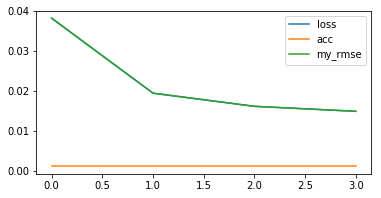

In [136]:
def _fit_model_(model,train_generator,model_params=None,epochs=5,callbacks=None,verbose=2,workers=3):
    import bs_ds as bs
    import functions_combined_BEST as ji
    from IPython.display import display

    quiet_command = ji.quiet_mode(True,True,True)
    exec(quiet_command)
    
    if model_params is None:
        model_params={}
    model_params['fit_params'] = {'epochs':epochs}#,'callbacks':callbacks}

    # Instantiating clock timer
    clock = bs.Clock()

    print('---'*20)
    print('\tFITTING MODEL:')
    print('---'*20,'\n')     
    
    # start the timer
    clock.tic('')

    # Fit the model
    fit_params = model_params['fit_params']
    if callbacks is None:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'], 
                                       verbose=2, use_multiprocessing=True, workers=3)
    else:
        
        history = model.fit_generator(train_generator,epochs=fit_params['epochs'],
                                       callbacks=callbacks,
                                       verbose=2,use_multiprocessing=True, workers=3)
    # model_results = model.history.history
    clock.toc('')
    
    return model,model_params,history
#########################################################################################
# Fit keras model to train_generator

model1,model_params,history =_fit_model_(model1,train_generator,
                                          model_params=model_params,
                                          epochs=4,callbacks=callbacks)

# Get results from model.evaluate_generator()
eval_results = ji.evaluate_model_plot_history(model1, train_generator, test_generator)


In [137]:
# ## REFERNCE FOR CONTENTS OF CONFIG (for writing function below)

# def get_model_config_df(model1, multi_index=True):
#     model_config_dict = model1.get_config()
#     model_layer_list=model_config_dict['layers']
#     output = [['#','layer_name', 'layer_config_level','layer_param','param_value']]#,'param_sub_value','param_sub_value_details' ]]

#     for num,layer_dict in enumerate(model_layer_list):
#     #     layer_dict = model_layer_list[0]


#         # layer_dict['config'].keys()
#         # config_keys = list(layer_dict.keys())
#         # combine class and name into 1 column
#         layer_class = layer_dict['class_name']
#         layer_name = layer_dict['config'].pop('name')
#         col_000 = num
#         col_00 = f"{layer_class} ({layer_name})"

#         # get layer's config dict
#         layer_config = layer_dict['config']


#         config_keys = list(layer_config.keys())


#         # for each parameter in layer_config
#         for param_name,col2_v_or_dict in layer_config.items():
#             # col_1 is the key( name of param)
#         #     col_1 = param_name


#             # check the contents of col2_:

#             # if list, append col2_, fill blank cols
#             if isinstance(col2_v_or_dict,dict)==False:
#                 col_0 = 'top-level'
#                 col_1 = param_name
#                 col_2 = col2_v_or_dict
#                 col_3 = ''
#                 col_4 = ''
#                 output.append([col_000,col_00,col_0,col_1 ,col_2])#,col_3,col_4])


#             # else, set col_2 as the param name,
#             if isinstance(col2_v_or_dict,dict):

#                 param_sub_type = col2_v_or_dict['class_name']
#                 col_0 = param_name +'  ('+param_sub_type+'):'

#                 # then loop through keys,vals of col_2's dict for col3,4
#                 param_dict = col2_v_or_dict['config']

#                 for sub_param,sub_param_val in param_dict.items():
#                     col_1 =sub_param
#                     col_2 = sub_param_val
#                     col_3 = ''

#                     if isinstance(v_col4,dict):
#                         print('dict')
#                     output.append([col_000,col_00,col_0, col_1 ,col_2])#,col_3,col_4])
        
#     df = bs.list2df(output)    
#     if multi_index==True:
#         df.sort_values(by=['#','layer_config_level'], ascending=False,inplace=True)
#         df.set_index(['#','layer_name','layer_config_level','layer_param'],inplace=True) #=pd.MultiIndex()
#     return df

# df = get_model_config_df(model1,multi_index=True)
# df.head()


In [138]:
import function_widgets as fw
reload(fw)
reload(ji)
import bs_ds as bs
bs.big_pandas()

model_summary_df = fw.make_qgrid_model_menu(model1,return_df=True)

display.max_columns=None
display.expand_frame_repr=False
display.max_rows=None
display.max_info_columns=500
display.precision=4


QgridWidget(grid_options={'fullWidthRows': True, 'syncColumnCellResize': True, 'forceFitColumns': True, 'defau…

In [139]:
# funcs_fit_eval_model=['fit_model', 'evaluate_model_plot_history',
#                   'get_predictions_df_and_evaluate_model', 'compare_time_shifted_model']
# ihelp_menu(funcs_fit_eval_model)

In [140]:
model_summary_df.to_excel('model1_config_df.xlsx', sheet_name='Keras Model Config')

In [141]:
ji.display_dict_dropdown(model_params)

------------ Dictionary Contents ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

In [142]:
### PREFER NEW WAY - GET DF_MODEL FIRST THEN GET EVALUATE_REGRESSION INFORMATION?
# # Get true vs pred data as a dataframe
df_model1 = ji.get_model_preds_df(model1, test_generator=test_generator,
                                  true_train_series = df_train['price'],
                                  true_test_series = df_test['price'],model_params=model_params,
                                  preds_from_gen=True, preds_from_train_preds=True, preds_from_test_preds=True,
                                 inverse_tf=True,iplot=True)

regr_evals = ji.get_evaluate_regression_dict(df_model1)

56 56 56
Removed i_.
Using all columns...


,U
# of Bins Shifted,
-4,1.693
-3,1.591
-2,1.358
-1,0.8474
0,1.424
1,1.888
2,2.185
3,2.411


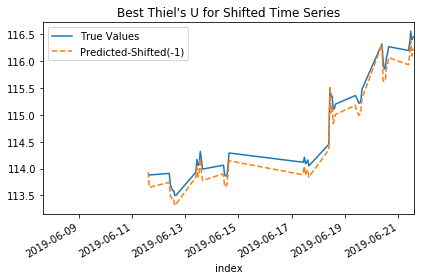

In [143]:
df_shifted = jik.compare_u_for_shifts(df_model1['true_from_gen'],df_model1['pred_from_gen'],
                        shift_list=np.arange(-4,4,1),
                        plot_all=False, plot_best=True,
                        color_coded=True,return_results=False,
                                     return_shifted_df=True)

# res_df = ji.compare_time_shifted_model(df_model1,)

In [144]:
res_df_gen = ji.compare_time_shifted_model(df_model1,true_colname='true_from_gen',
                                      pred_colname='pred_from_gen',show_U_info=False,
                                          caption='From Generator')

res_df_from_train = ji.compare_time_shifted_model(df_model1,true_colname='true_from_train_preds',
                                      pred_colname='pred_from_train_preds', show_U_info=False,
                                                 caption='From Preds of Train Preds')

res_df_from_test = ji.compare_time_shifted_model(df_model1,true_colname='true_from_test_preds',
                                      pred_colname='pred_from_test_preds', show_U_info=False,
                                                 caption='From Preds of Test Preds')

,R_squared,Root Mean Squared Error,Thiel's U
Bins Shifted,,,
-4,0.786,0.407,1.693
-3,0.823,0.383,1.591
-2,0.879,0.322,1.358
-1,0.955,0.202,0.847
0,0.882,0.332,1.424
1,0.788,0.445,1.888
2,0.714,0.517,2.185
3,0.642,0.576,2.411


,R_squared,Root Mean Squared Error,Thiel's U
Bins Shifted,,,
-4,-32.21,4.751,18.69
-3,-30.19,4.766,18.78
-2,-28.82,4.776,18.9
-1,-27.57,4.786,19.06
0,-26.5,4.795,19.23
1,-26.75,4.79,19.4
2,-26.63,4.785,19.6
3,-26.26,4.779,19.43


,R_squared,Root Mean Squared Error,Thiel's U
Bins Shifted,,,
-4,-25.43,4.525,18.86
-3,-24,4.543,18.96
-2,-23.07,4.556,19.1
-1,-22.23,4.568,19.32
0,-21.51,4.579,19.53
1,-21.42,4.572,19.32
2,-21.31,4.565,19.25
3,-21.41,4.557,19.05


In [145]:
reload(fw)
reload(jik)
reload(ji)

<module 'functions_combined_BEST' from 'D:\\Users\\James\\Dropbox (Personal)\\CODING\\_FLATIRON\\Mod5_FinalProject\\dsc-5-capstone-project-online-ds-ft-021119\\functions_combined_BEST.py'>

```python
import cufflinks as cf
from ipywidgets import interact

@interact
def scatter_plot(x=list(df.select_dtypes('number').columns), 
                 y=list(df.select_dtypes('number').columns)[1:],
                 theme=list(cf.themes.THEMES.keys()), 
                 colorscale=list(cf.colors._scales_names.keys())):
    
    df.iplot(kind='scatter', x=x, y=y, mode='markers', 
             xTitle=x.title(), yTitle=y.title(), 
             text='title',
             title=f'{y.title()} vs {x.title()}',
            theme=theme, colorscale=colorscale)
```

In [146]:
import bs_ds as bs
import functions_combined_BEST as ji
reload(jik)
reload(ji)

<module 'functions_combined_BEST' from 'D:\\Users\\James\\Dropbox (Personal)\\CODING\\_FLATIRON\\Mod5_FinalProject\\dsc-5-capstone-project-online-ds-ft-021119\\functions_combined_BEST.py'>

In [147]:
# ##### SUPER IMPORTANT CELL
# scaled_train_data = df_train['price']
# scaled_test_data = df_test['price']

# get_model_preds_from_preds= ji.get_model_preds_from_preds
# def get_preds_from_preds(model1,scaled_train_data, scaled_test_data,
#                          model_params=None, n_input=None, n_features=None, 
#                          build_preds_from_train=True, return_df=True,suffix=None):
    
#     """ Gets predictions from model using using its own predictions as the subsequent input.
#     Must provide a model_params dictionary with 'input_params' OR must define ('n_input','n_features').
    
#     * IF build_preds_from_train is True:
#         1. starting true time series for predictions is the last rows [-n_input:] from training data.
#         2. output predicitons will be the same length as the input scaled_test_data
    
#     * IF build_preds_from_train is False:
#         1. starting true time series for predictions is the first rows [:n_input] from test data.
#         2. output predicitons will be shorter by n_input # of rows
#         """
#     test_predictions = []
#     first_eval_batch=[]
#     index_tracker = []
    
#     if model_params is not None:
#         n_input= model_params['input_params']['n_input']
#         n_features = model_params['input_params']['n_features']

#     if model_params is None:
#         if n_input is None or n_features is None:
#             raise Exception('Must provide model params or define n_input and n_features')
        

#     preds_out = [['i','index','pred']]
    
#     # SAVING COPY OF INPUT TEST DATA
#     scaled_test_series = scaled_test_data.copy() 

#     ## SAVING TRAIN AND TEST DATA INDICES AND VALUES
#     train_data_index = scaled_train_data.index
#     scaled_train_data = scaled_train_data.values
#     test_data_index = scaled_test_data.index
#     scaled_test_data = scaled_test_data.values
    
    
#     ## PREPARE THE FIRST EVAL BATCH TIMESERIES FROM TRAIN OR TEST DATA
#     # Change parameters depending on if from train or test data
#     if build_preds_from_train:
        
#         # If using trianing data loop through full test data
#         loop_length = range(len(scaled_test_data))
        
#         # take the last window size of data from training data 
#         first_eval_batch = scaled_train_data[-n_input:]
#         first_batch_idx = train_data_index[-n_input:]
        
#         # set the true index to test_data_index
#         true_index_out = test_data_index
        
#     # Set the loop to be from n_input # of rows into test_data
#     else:
#         loop_length = range(n_input,len(scaled_test_data))
#         first_eval_batch = scaled_test_data[:n_input]
#         true_index_out =  test_data_index[n_input:]
      
    
#     # reshape first batch of data for model.predict 
#     current_batch = first_eval_batch.reshape((1, n_input, n_features))

    
#     ## LOOP THROUGH REMAINING TIMEBINS USING CURRENT PREDICITONS AS NEW DATA FOR NEXT
#     for i in loop_length:

#         # get prediction 1 time stamp ahead ([0] is for grabbing just the number instead of [array])
#         current_pred = model.predict(current_batch)[0]        
#         # store prediction
#         test_predictions.append(current_pred) 

#         # update batch to now include prediction and drop first value
#         current_batch = np.append(current_batch[:,1:,:],[[current_pred]],axis=1)
        
#         ## Append the data to the output df list
#         preds_out.append([i,test_data_index[i],current_pred[0]])


#     ## If returning a dataframe,prepare and rename with suffix
#     if return_df:
#         res_df = bs.list2df(preds_out)
#         res_df['index'] = pd.to_datetime(res_df['index'])
#         res_df.set_index('index',inplace=True)
        
#         # adding true price
#         res_df['true'] = scaled_test_series.loc[true_index_out]
#         res_df=res_df[['i','true','pred']]
        
#         if suffix is not None:
#             colnames = [name+suffix for name in res_df.columns]
#         else:
#             colnames = res_df.columns
            
#         res_df.columns=colnames
#         return res_df #test_predictions, checks
    
#     # Else just return array of predictions
#     else:
#         return test_predictions

    
    
# def get_model_preds_from_gen(model,test_generator,true_test_data,model_params=None,
#                        n_input=None, n_features=None, suffix=None, return_df=False):
#         """
#         Gets prediction from model using the generator's timeseries using model.predict_generator()
#         Must provide a model_params dictionary with 'input_params' OR must define ('n_input','n_features').

#         """
#         if model_params is not None:
#             n_input= model_params['input_params']['n_input']
#             n_features = model_params['input_params']['n_features']

#         if model_params is None:
#             if n_input is None or n_features is None:
#                 raise Exception('Must provide model params or define n_input and n_features')

#         # GET TRUE VALUES AND DATETIME INDEX FROM GENERATOR
        
#         # Get true time index from the generator's start_index and end_index 
#         gen_index = true_test_data.index[test_generator.start_index:test_generator.end_index+1]
#         gen_true_targets = test_generator.targets[test_generator.start_index:test_generator.end_index+1]
        
        
#         # Generate predictions from the test_generator
#         gen_preds = model.predict_generator(test_generator)
#         gen_preds_flat = gen_preds.ravel()
        
#         gen_true_targets = gen_true_targets.ravel()
        
        
#         # RETURN OUTPUT AS DATAFRAME OR ARRAY OF PREDS
#         if return_df:
#             # Combine the outputs
#             gen_pred_df = pd.DataFrame({'index':gen_index,'true':gen_true_targets,'pred':gen_preds_flat})
#             gen_pred_df['index'] = pd.to_datetime(gen_pred_df['index'])
#             gen_pred_df.set_index('index',inplace=True)

#             if suffix is not None:
#                 colnames = [name+suffix for name in gen_pred_df.columns]
#             else:
#                 colnames = gen_pred_df.columns
#             return gen_pred_df
#         else:
#             return gen_preds


# def compare_model_pred_methods(model, true_train_series,true_test_series, test_generator=None,
#                                model_params=None, n_input=None, n_features=None, from_gen=True,
#                                from_train_series = True, from_test_series=True, 
#                                iplot=True, plot_with_train_data=True,return_df=True, inverse_tf=True):
#     """ Gets predictions for training data from the 3 options: 
#     1) from generator  --  len(output) = (len(true_test_series)-n_input)
#     2) from predictions on test data  --  len(output) = (len(true_test_series)-n_input)
#     3) from predictions on train data -- len(true_test_series)
#     """
#         if model_params is not None:
#             n_input= model_params['input_params']['n_input']
#             n_features = model_params['input_params']['n_features']

#         if model_params is None:
#             if n_input is None or n_features is None:
#                 raise Exception('Must provide model params or define n_input and n_features')
                
#         if from_gen is True and test_generator is None:
#             raise Exception('If from_gen=True, must provide generator.')

                
#         ### GET the 3 DIFERENT TYPES OF PREDICTIONS    
#         df_list = []
#         if from_gen:
#             gen_df = ji.get_model_preds_from_gen(model, test_generator,true_test_series,
#                                                  model_params=model_params, n_input=n_input, n_features=n_features, 
#                                                 suffix='_from_gen',return_df=True)    
#             df_list.append(gen_df)

#         if from_test_series:
#             func_df_from_test = ji.get_model_preds_from_preds(model, true_train_series,true_test_series,
#                                                           model_params=model_params, n_input=n_input, 
#                                                           n_features=n_features, suffix='_from_test',
#                                                           build_preds_from_train=False, return_df=True)
#             df_list.append(func_df_from_test)

#         if from_train_series:
#             func_df_from_train  = ji.get_model_preds_from_preds(model,true_train_series,true_test_series,
#                                                                 model_params=model_params, n_input=n_input,
#                                                                 suffix='_from_train', build_preds_from_train=True,
#                                                             return_df=True)
#             df_list.append(func_df_from_train)

#         # bs.display_side_by_side(func_df,func_df_from_train)

#         df_all_preds = pd.concat([df for df in df_list],axis=1)
#         df_all_preds = bs.drop_cols(df_all_preds,['i_'])


#         if inverse_tf:
#             df_out = ji.transform_cols_from_library(df_all_preds,single_scaler=model_params['scaler_library']['price'],inverse=True)
#         else:
#             df_out = df_all_preds

#         if iplot:
#             if plot_with_train_data is False:
#                 ji.plotly_time_series(df_out)
#             else:
#                 true_train_price = ji.inverse_transform_series(true_train_series,model_params['scaler_library']['price'])
#                 df_plot = pd.concat([true_train_price,df_out],axis=1)
#                 ji.plotly_time_series(df_plot)

#         if return_df:
#             return df_out

In [148]:
# df_all_preds = ji.compare_model_pred_methods(model1, true_train_series=df_train['price'],
#                                              true_test_series=df_test['price'], test_generator=test_generator,
#                                              model_params=model_params,  n_input=None, n_features=None,
#                                              from_gen=True, from_train_series = True, from_test_series=True,
#                                              iplot=True, plot_with_train_data=True, return_df=True, inverse_tf=True) 


In [149]:
ji.display_dict_dropdown(model_params)

------------ Dictionary Contents ------------


interactive(children=(Dropdown(description='dict_to_display', options={'data_params': {'num_test_days': 10, 'n…

In [150]:
# model_params_test = model_params            
# ji.display_dict_dropdown(model_params_test)
# # inspect.isfunction(model_params['compile_params']['metrics'][1])

# tuples_of_functions = (
#     ('callbacks','EarlyStopping','monitor'),
#     ('callbacks','ModelCheckpoint','monitor'),
#     ('compile_params','loss'), 
#     ('compile_params','metrics',slice(1)),
# )
# 
# ['callbacks']['ModelCheckpoint']['monitor']
# ['compile_params']['loss']
# model_params['compile_params']['metrics'][1]

# # model_params
# import inspect
# import sys
# sys.setrecursionlimit(4000)

# tuples_of_functions = (
#     ('callbacks','EarlyStopping','monitor'),
#     ('callbacks','ModelCheckpoint','monitor'),
#     ('compile_params','loss'), 
#     ('compile_params','metrics',slice(1)))
# # 

# def replace_model_params(model_params, tuples_of_functions):
# #     tup =
#     import inspect 
#     for param in tuples_of_functions:
#         if len(param)==3:
#             replace_me = model_params[param[0]][param[1]][param[2]]
            
#             if inspect.isfunction(replace_me):
#                 replace_with = inspect.getsource(replace_me)
#                 model_params[param[0]][param[1]][param[2]]=replace_with
        
#         elif len(param)==2:
#             replace_me = model_params[param[0]][param[1]]
            
#             if inspect.isfunction(replace_me):
#                 replace_with = inspect.getsource(replace_me)
#                 model_params[param[0]][param[1]]=replace_with
#         else:
#             print(f"model_params[{param}] not found.")
            
#     return model_params
    
    
# test_model_params = replace_model_params(model_params, tuples_of_functions)
# ji.display_dict_dropdown(test_model_params)
    
    
# # def _find_functions(obj):
# #     import inspect 

# #     # if its a function, replace and return
# #     if inspect.isfunction(obj):
# #         replace_with = inspect.getsource(obj)
# #         return replace_with

# #     # if its a list, check list:
# #     elif isinstance(obj,list):
# #         for item in obj:
# #             item = _find_functions(obj)

# #     # if a dict, check dict
# #     elif isinstance(obj,dict):
# #         for k,v in obj.items():
# #             item = _find_functions(v)
# #     else:
# #         return obj
    
    
# # def replace_functions_in_params(model_params):
# #     replace_dict = {}
# #     keys_to_clean = ['callbacks','compile_params','fit_params']
# #     replace_dict = model_params
    
# #     for key in keys_to_clean:
        
# #         if isinstance(model_params[key],dict):
# #             for k,v in model_params[key].items():
# #                 replace_dict[k] = _find_functions(v)
                
# #         elif isinstance(model_params[key],list):
# #             for x in model_params[key]:
# #                 replace_dict[k] = _find_functions(x)

            
# #     return replace_dict

# # # test_replace = replace_functions_in_params(model_params)

    
# # # def _finditem(obj, key):
# # #     if key in obj: 
# # #         return obj[key]
    
# # #     for k, v in obj.items():
# # #         if isinstance(v,dict):
            
# # #             item = _finditem(v, key)
# # #             if item is not None:
# # #                 return item
            
            

In [167]:
s2=shelve.open(model1_params_file)
try:
    existing=s2.
finally:
    s2.close()
print(existing)

ItemsView(<shelve.DbfilenameShelf object at 0x00000246FF788C18>)


In [ ]:
for k,v in 

In [169]:
import shelve
model1_params_file= 'model1_params.db'
s = shelve.open(model1_params_file)

for k,v in model_params.items():
    try:
        s[k]: v
            
    finally:
        s.close()
s.keys()
ihelp(s)

------------------------------------------------------------------------------------
------ HELP ------------------------------------------------------------------------

Help on DbfilenameShelf in module shelve object:

class DbfilenameShelf(Shelf)
 |  Shelf implementation using the "dbm" generic dbm interface.
 |  
 |  This is initialized with the filename for the dbm database.
 |  See the module's __doc__ string for an overview of the interface.
 |  
 |  Method resolution order:
 |      DbfilenameShelf
 |      Shelf
 |      collections.abc.MutableMapping
 |      collections.abc.Mapping
 |      collections.abc.Collection
 |      collections.abc.Sized
 |      collections.abc.Iterable
 |      collections.abc.Container
 |      builtins.object
 |  
 |  Methods defined here:
 |  
 |  __init__(self, filename, flag='c', protocol=None, writeback=False)
 |      Initialize self.  See help(type(self)) for accurate signature.
 |  
 |  -------------------------------------------------------------

TypeError: <shelve.DbfilenameShelf object at 0x0000024683199E10> is not a module, class, method, function, traceback, frame, or code object

In [151]:
ji.save_model_weights_params(model1,model_params=model_params,
                             filename_prefix='models/model1',
                             auto_increment_name=True,
                         auto_filename_suffix=True, 
                             suffix_time_format='%m-%d-%y_%I%M%p')

Model saved as models/model1_07-31-19_1021pm.json


TypeError: can't pickle _thread.RLock objects

# BOOKMARK - SAVING MODEL 1, STARTING MODEL 2


## KERAS MODEL 2 - COMBINING STOCK PRICE AND INDICATORS

- [ ] already have data in df_train/test just take full dataframe as X (and just 'price' as y)

In [ ]:
# ########## SET TRAINING AND TEST SET PARAMETERS: ############
model_params2={}
model_params2['data_params'] = ji.def_data_params(stock_df,verbose=0)

###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######

df_train, df_test = ji.train_test_split_by_last_days(
    stock_df, periods_per_day= model_params['data_params']['periods_per_day'], 
    num_test_days= model_params['data_params']['num_test_days'],
    num_train_days=model_params['data_params']['num_train_days'],
    verbose=0, iplot=False)

###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
scaler_library, df_train, model_params =\
    ji.make_scaler_library(df_train, transform=True, model_params=model_params, verbose=0)
df_test = ji.transform_cols_from_library(df_test,scaler_library)


In [ ]:
columns_to_use = ['price','ma7','ma21','ewma','upper band','lower band']
train_generator, test_generator, model_params =\
    ji.make_train_test_series_gens(df_train[columns_to_use] ,df_test[columns_to_useuse],
                                   model_params, verbose=0)

callbacks, model_params = ji.def_callbacks_and_params(model_params,loss_function='my_rmse')


model_params = ji.def_compile_params_optimizer(loss='my_rmse',metrics=['acc','my_rmse'],
                                             optimizer='optimizers.Nadam()',model_params=model_params)

ji.display_dict_dropdown(model_params,title='Parameters for Keras Model')

model2=ji.make_model1(model_params)

In [ ]:
stock_df.columns

In [ ]:
########## SET TRAINING AND TEST SET PARAMETERS: ############
num_test_days=45 # Number of days for test data 
num_train_days=365 # Number of days for training data - 5 days/week * 52 weeks
days_for_x_window = 1 # Number of days to 
############################################################

# Calculate number of rows to bin for x_windows
periods_per_day = get_day_window_size_from_freq(stock_df, custom_BH_freq()) # get the # of rows that == 1 day
x_window = periods_per_day * days_for_x_window 
print(f'X_window size = {x_window} -- ({days_for_x_window} day(s) * {periods_per_day} rows/day)\n')
    
###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
df_train, df_test = train_test_split_by_last_days(stock_df.drop('filled_timebin',axis=1), periods_per_day=periods_per_day, num_test_days=num_test_days,
                                                  num_train_days=num_train_days,verbose=1, plot=True)


###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
scaler_library , df_train = make_scaler_library(df_train,transform=True)
# Transform test data with train data's scaler_library
df_test = transform_cols_from_library(df_test,scaler_library)

## Display Preview of Scaled Dataset
# display(df_train.head(2).style.set_caption('df_train'),df_test.head(2).style.set_caption('df_test') )

In [ ]:
## REPLACE MADE_DF_TIMESERIES_BINS_BY_COLUMN with Kera's TimeseriesGenerator
from keras.preprocessing.sequence import TimeseriesGenerator

# Define shape of data by specifing these vars:
n_input = x_window # Number of timebins to analyze at once. Note: try to choose # greater than length of seasonal cycles
n_features= df_train.shape[1] # Number of columns
batch_size = 1 # Generally 1 for sequence data

# RESHAPING TRAINING AND TEST DATA 
# train_data = df_train.values #.reshape(-1,1)
# test_data = df_testvalues #.reshape(-1,1)
train_data_index =  df_train.index
test_data_index = df_test.index


## Create Generator for Training Data
train_generator = TimeseriesGenerator(data=df_train.values, targets=df_train['price'].values,# reshape(-1,1),
                                      length=n_input, batch_size=batch_size )

test_generator = TimeseriesGenerator(data=df_test.values, targets=df_test['price'].values, #reshape(-1,1),
                                     length=n_input, batch_size=batch_size )


# What does the first batch look like?
X,y = train_generator[0]
print(f'Given the Array: \t(with shape={X.shape})')#' \n{X.flatten()}')
print(f'\nPredict this y: \n {y}')

In [ ]:
from keras.models import Sequential
from keras.layers import Bidirectional, Dense, LSTM

# Specifying input shape (size of samples, rank of samples?)
# input_shape =  (X_train_in.shape[1],1)
n_input = x_window # number of time bins in a day * number of days
n_features = df_train.shape[1]

input_shape=(n_input, n_features)


# Create model architecture
model2 = Sequential()


model2.add(LSTM(units=100, return_sequences=True, input_shape =input_shape))
model2.add(LSTM(units=50))
model.add(Dense(10))
model2.add(Dense(1))

model2.compile(loss=my_rmse, optimizer=optimizers.Nadam(), metrics=['acc'])#,my_rmse])#,metrics=['acc'])
display(model2.summary())

# start the timer
clock.tic('')

# Fit the model
# history = model2.fit_generator(X_train_in, y_train, epochs=2, verbose=0, validation_split=(0.25))
history = model2.fit_generator(train_generator,epochs=3,verbose=2,callbacks=callbacks,workers=3)

# stop clock
clock.toc('')
duration = print(clock._lap_duration_)

# from mod4functions_JMI import plot_keras_history
# plot_keras_history(history);


# # EVALUATE MODEL PREDICTIONS FROM GENERATOR 
model_metrics_train = model2.evaluate_generator(train_generator)
model_metrics_test = model2.evaluate_generator(test_generator)
print('\n')
print('---'*40)
print('\tEVALUATE MODEL:')
print('---'*40)
eval_gen_dict = {}
eval_gen_dict['Training Data'] = dict(zip(model2.metrics_names,model_metrics_train))
eval_gen_dict['Test Data'] = dict(zip(model2.metrics_names,model_metrics_test))

display(pd.DataFrame(eval_gen_dict))

# duration = print(clock._lap_duration_)
plt.figure(figsize=(6,3))
for k,v in model_results.items():
    plt.plot(range(len(v)),v, label=k);
plt.legend()

In [ ]:
ji.reload(ji)
print('---'*40)
print('\tEVALUATE MODEL:')
print('---'*40)
# from mod4functions_JMI import plot_keras_history_custom
# plot_keras_history_custom(history);
# [print(f'{k}={np.round(v,4)}') for k,v in model_results.items()];

# GET PREDICTIONS FOR TRAINING DATA AND TEST DATA
test_predictions = ji.arr2series(model2.predict_generator(test_generator), test_data_index[x_window:], 'Predicted Test Price')
train_predictions = ji.arr2series(model2.predict_generator(train_generator), train_data_index[x_window:], 'Predicted Train Price')

# GET TRUE TEST AND TRAIN DATA AS SERIES
true_test_price = pd.Series( df_test['price'].iloc[n_input:], index= test_data_index[x_window:], name='True Test Price')
true_train_price = pd.Series(df_train['price'].iloc[n_input:],index = train_data_index[x_window:], name='True Train Price')

# COMBINE TRUE/PRED TRAIN/TEST DATA
df_model_preds = pd.concat([true_train_price,train_predictions,true_test_price,test_predictions], axis=1)

## CONVERT BACK TO DOLLARS AND PLOT
df_model_preds_tf = pd.DataFrame()
for col in df_model_preds.columns:
    df_model_preds_tf[col] = transform_series(df_model_preds[col],scaler_library['price'],inverse=True) 

In [ ]:
    
# PLOTTING TRAINING + TRUE/PRED TEST DATA
ji.plot_true_vs_preds_subplots(df_model_preds_tf['True Train Price'],df_model_preds_tf['True Test Price'], 
                            df_model_preds_tf['Predicted Test Price'], subplots=True);    


# GET EVALUATION METRICS FROM PREDICTIONS
true_test_series = df_model_preds_tf['True Test Price'].dropna()
pred_test_series = df_model_preds_tf['Predicted Test Price'].dropna()
results_tf = evaluate_regression(true_test_series, pred_test_series)
display(results_tf)

In [ ]:
# COMPARE SHIFTED VALUES FOR THIEL's U
res_u = compare_u_for_shifts(true_test_price,test_predictions,shift_list=np.arange(-4,4,1), plot_all=False,plot_best=True)
display(res_u)
# compare_u_for_shifts(true_test_price,test_predictions,shift_list=np.arange(-4,4,1), plot_all=False,plot_best=True)
res_df = compare_eval_metrics_for_shifts(true_test_price, test_predictions,shift_list=np.arange(-4,4,1))

res_df_ = res_df.swaplevel(i=-2, j=-2, axis=0).unstack(-1)
# res_df_.index
display(res_df_)

In [ ]:
save_model_and_weights(model2,'stock_plus_indicators_U39_shift-1')


___

___

## Blog Post Code
- NEW BLOG POST - LSTM TIME SERIES FORECASTING
    - https://machinelearningmastery.com/how-to-develop-lstm-models-for-time-series-forecasting/
- https://www.analyticsvidhya.com/blog/2018/10/predicting-stock-price-machine-learningnd-deep-learning-techniques-python/

In [ ]:
stop

In [ ]:
from keras.layers import TimeDistributed, Conv1D, MaxPool1D, Flatten, LSTM, Dense, MaxPooling1D
model3 = Sequential()
# input_shape =  (X_train_in.shape[0],X_train_in.shape[1],1)
input_shape=(n_input, n_features,1)

model3.add(TimeDistributed(Conv1D(filters=64, kernel_size=1, activation='relu'), input_shape=input_shape)) #(None, n_steps, n_features)))
model3.add(TimeDistributed(MaxPooling1D(pool_size=2)))
model3.add(TimeDistributed(Flatten()))
model3.add(LSTM(50, activation='relu'))
model3.add(Dense(1))
model3.compile(optimizer='adam', loss=my_rmse)
model3.summary()
# fit model

clock.tic('')
history3 = model3.fit_generator( train_generator,epochs=3,verbose=2,callbacks=callbacks,workers=3)

clock.toc('')
evaluate_model_plot_history(model3, train_generator, test_generator)

In [ ]:
#(X_train_in, y_train, epochs=500, verbose=0)
# demonstrate prediction
# x_input = array([60, 70, 80, 90])
# x_input = x_input.reshape((1, n_seq, n_steps, n_features))

# yhat = model.predict(X_test_in, verbose=0)
# print(yhat)

# predictions = pd.Series(predictions.ravel(),name='predicted_price',index=index_test)
# true_price =  pd.Series(y_test,name='true_price',index=index_test)

# df_predictions = pd.concat([predictions,true_price],axis=1)#, columns=['predicted_price','true_price'], index=index_test)
# display(df_predictions.head())

# # Plot outcome
# mpl.rcParams['figure.figsize']=(12,4)
# plt.plot(df_train_bins['price_labels'])
# plt.plot(df_predictions)


In [ ]:
print('---'*40)
print('\tEVALUATE MODEL:')
print('---'*40)
# from mod4functions_JMI import plot_keras_history_custom
# plot_keras_history_custom(history);
# [print(f'{k}={np.round(v,4)}') for k,v in model_results.items()];

# GET PREDICTIONS FOR TRAINING DATA AND TEST DATA
test_predictions = arr2series(model3.predict_generator(test_generator), test_data_index[x_window:], 'Predicted Test Price')
train_predictions = arr2series(model3.predict_generator(train_generator), train_data_index[x_window:], 'Predicted Train Price')

# GET TRUE TEST AND TRAIN DATA AS SERIES
true_test_price = pd.Series( df_test['price'].iloc[n_input:], index= test_data_index[x_window:], name='True Test Price')
true_train_price = pd.Series(df_train['price'].iloc[n_input:],index = train_data_index[x_window:], name='True Train Price')

# COMBINE TRUE/PRED TRAIN/TEST DATA
df_model_preds = pd.concat([true_train_price,train_predictions,true_test_price,test_predictions], axis=1)

## CONVERT BACK TO DOLLARS AND PLOT
df_model_preds_tf = pd.DataFrame()
for col in df_model_preds.columns:
    df_model_preds_tf[col] = inverse_transform_series(df_model_preds[col],scaler_library['price']) 

    
# PLOTTING TRAINING + TRUE/PRED TEST DATA
plot_true_vs_preds_subplots(df_model_preds_tf['True Train Price'],df_model_preds_tf['True Test Price'], 
                            df_model_preds_tf['Predicted Test Price'], subplots=True);    


# GET EVALUATION METRICS FROM PREDICTIONS
true_test_series = df_model_preds_tf['True Test Price'].dropna()
pred_test_series = df_model_preds_tf['Predicted Test Price'].dropna()
results_tf = evaluate_regression(true_test_series, pred_test_series)
display(results_tf)



In [ ]:
STOP
# PREVIEW DATA CONTENTS
# display(df_train_bins.head())
df_train_bins['price_labels'].plot()
df_test_bins['price_labels'].plot()


print('Train Index: ',df_train_bins.index[[0,-1]])
print('Test Index: ',df_test_bins.index[[0,-1]])

In [ ]:
#importing required libraries

from sklearn.preprocessing import MinMaxScaler
from keras.models import Sequential
from keras.layers import Dense, Dropout, LSTM

time_index =stock_df.index.values
stock_df['date'] = time_index# .astype('str')

#creating dataframe
data = stock_df[['date','price']]

new_data = pd.DataFrame(index=range(0,len(stock_df)),columns=['date', 'price'])
display(new_data.head()), display(data.head())

for i in range(0,len(data)):
    new_data['date'][i] = data['date'][i]
    new_data['price'][i] = data['price'][i]

#setting index
new_data.index = new_data.date
new_data.drop('date', axis=1, inplace=True)


In [ ]:
new_data

In [ ]:
#creating train and test sets
dataset = new_data.values

train = dataset[0:987,:]
valid = dataset[987:,:]

#converting dataset into x_train and y_train
scaler = MinMaxScaler(feature_range=(0, 1))
scaled_data = scaler.fit_transform(dataset)

x_train, y_train = [], []
for i in range(60,len(train)):
    x_train.append(scaled_data[i-60:i,0])
    y_train.append(scaled_data[i,0])
x_train, y_train = np.array(x_train), np.array(y_train)
print(x_train.shape, y_train.shape)
x_train = np.reshape(x_train, (x_train.shape[0],x_train.shape[1],1))
print(x_train.shape)

In [ ]:
# create and fit the LSTM network
model = Sequential()
model.add(LSTM(units=50, return_sequences=True, input_shape=(x_train.shape[1],1)))
model.add(LSTM(units=50))
model.add(Dense(1))

model.compile(loss='mean_squared_error', optimizer='adam')
model.fit(x_train, y_train, epochs=1, batch_size=1, verbose=2)

#predicting 246 values, using past 60 from the train data
inputs = new_data[len(new_data) - len(valid) - 60:].values
inputs = inputs.reshape(-1,1)
inputs  = scaler.transform(inputs)

X_test = []
for i in range(60,inputs.shape[0]):
    X_test.append(inputs[i-60:i,0])
X_test = np.array(X_test)

X_test = np.reshape(X_test, (X_test.shape[0],X_test.shape[1],1))
closing_price = model.predict(X_test)
closing_price = scaler.inverse_transform(closing_price)

In [ ]:
rms=np.sqrt(np.mean(np.power((valid-closing_price),2)))
rms

In [ ]:
#for plotting
train = new_data[:987]
valid = new_data[987:]
valid['Predictions'] = closing_price
plt.plot(train['price'])
plt.plot(valid[['price','Predictions']])
plt.show()

-#
\# ✔ BOOKMARK - RESUMING ANALYSIS WITH NEW FUNCTIONS
- Check Evernote log: https://www.evernote.com/l/AApgV1EaL9lEYpujWnwHq62W9QyEKkH4hwA/


# IMPORTING NLP TWITTER NEURAL NETWORK Load In NLP Twitter Model

In [ ]:
# STOP

In [ ]:
pd.set_option('display.max_columns',None)
df_tokenize = pd.read_csv('twitter_df_tokenized_with_price.csv',index_col=0, parse_dates=True)
df_tokenize.head()


In [ ]:
# Word2Vec 
filename = 'word2vec_model_twitter.pickle'
import pickle
with open(filename,'rb') as f:
    word_model,vector_size,embedding_matrix = pickle.load(f)

In [ ]:
# Loading in twitter LSTM model
from keras.models import model_from_json
with open ('bestNLPmodel_best_stock_increase.json','r') as f:
    twitter_model = model_from_json(f.read())
    twitter_model.load_weights('bestNLPmodel_best_stock_increase.h5')
    
for i, model_layer in enumerate(twitter_model.layers):
    twitter_model.get_layer(index=i).trainable=False
    print(model_layer,twitter_model.get_layer(index=i).trainable)
    
    
twitter_model.summary()

### LOADING IN TWITTER DATA TO GROUP

In [ ]:
ihelp(ji.load_raw_twitter_file), ihelp(ji.full_twitter_df_processing)

In [ ]:
import pandas as pd
import functions_combined_BEST as ji

In [ ]:
ji.ihelp(ji.full_twitter_df_processing)

In [ ]:
### LOAD IN AND PROCESS TWITTER DATA
ji.reload(ji)
twitter_df= ji.load_raw_twitter_file()
twitter_df = ji.full_twitter_df_processing(twitter_df,cleaned_tweet_col='clean_content')

# cols_to_drop = ['has_RT','starts_RT','content_starts_RT','content_hashtags','content_mentions']
# twitter_df.drop(cols_to_drop,axis=1,inplace=True)

display(twitter_df.head())
print(twitter_df.index[[0,-1]],twitter_df.index.freq)

In [ ]:
# # ofst = pd.offsets.CustomBusinessHour(start='09:30',end='16:30',)
# # ofstBH = pd.offsets.BusinessHour(n=1, start='09:30',end='16:30')
# # ts = pd.to_datetime('2019-07-11 14:23')
# # ofst.rollback(ts)
# num_offset=1
# twitter_df['date']
# freq=pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30')
# ofst = pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
# ofst.rollback(twitter_df['date'].iloc[0])

In [ ]:
print('Disabled this cell on 07/31')
# def make_time_index_intervals(twitter_df,col ='date', start=None,end=None, freq='CBH',num_offset=1):
#     """Takes a df, rounds first timestamp down to nearest hour, last timestamp rounded up to hour.
#     Creates 30 minute intervals based that encompass all data."""
#     import pandas as pd
    
    
#     if freq=='CBH':
#         freq=pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30')
#         ofst = pd.offsets.CustomBusinessHour(n=num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
#         ofst_early = pd.offsets.CustomBusinessHour(n=-num_offset,start='09:30',end='16:30') #freq=ji.custom_BH_freq()
#     if freq=='T':
#         ofst = pd.offsets.Minute(n=num_offset)
#         ofst_early = pd.offsets.Minute(n=-num_offset)
        
#     if freq=='H':
#         ofst = pd.offsets.Hour(n=num_offset)
#         ofst_early=pd.offsets.Hour(n=-num_offset)

# #     print(ofst)
#     if start is None:
#         # Get timebin before the first timestamp that starts     
#         start_idx = ofst.rollback(twitter_df[col].iloc[0].floor('H'))
#     else:
#         start_idx = pd.to_datetime(start)

#     if end is None:
#         # Get timbin after last timestamp that starts 30m into the hour.
#         end_idx= ofst.rollforward(twitter_df[col].iloc[-1].ceil('H'))
#     else:
#         end_idx = pd.to_datetime(end)


#     # Make time bins using the above start and end points 
#     print(f'start:{start_idx}, end:{end_idx}, freq:{freq}')
#     time_range = pd.date_range(start =start_idx, end = end_idx, freq=freq)#.to_period()
#     time_intervals = pd.interval_range(start=start_idx, end=end_idx,freq=freq,name='CBH_intervals',closed='left')
    
#     return time_intervals


# def int_to_ts(int_list, as_datetime=False, as_str=True):
#     """Helper function: accepts one Panda's interval and returns the left and right ends as either strings or Timestamps."""
#     import pandas as pd
#     if as_datetime & as_str:
#         raise Exception('Only one of `as_datetime`, or `as_str` can be True.')
    
#     left_edges =[]
#     right_edges= []
    
#     for interval in int_list:
        
#         int_str = interval.__str__()[1:-1]
#         output = int_str.split(',')
#         left_edges.append(output)
# #         right_edges.append(right)
        
    
#     if as_str:
#         return left_edges#, right_edges
    
#     elif as_datetime:
#         left = pd.to_datetime(left)
#         right = pd.to_datetime(right)
#         return left,right
    

# def bin_df_by_date_intervals(test_df,time_intervals,column='date',roll_freq='CBH'):
#     """Uses pd.cut with half_hour_intervals on specified column.
#     Creates a dictionary/map of integer bin codes. 
#     Adds column"int_bins" with int codes.
#     Adds column "left_edge" as datetime object representing the beginning of the time interval. 
#     Returns the updated test_df and a list of bin_codes."""
#     import pandas as pd
    
#     if roll_freq=='CBH':
#         ofst = pd.offsets.CustomBusinessHour(start='09:30',end='16:30')
        
#         # Make a rolled_date column to use for bining
#         test_df['rolled_date'] = test_df[column].apply(lambda x: ofst.rollforward(x))
    
#     # Cut The Date column into interval bins, 
#     cut_date = pd.cut(test_df['rolled_date'], bins=time_intervals)#,labels=list(range(len(half_hour_intervals))), retbins=True)
#     test_df['int_times'] = cut_date    
#     print(test_df.isna().sum())
#     test_df.dropna(inplace=True)
#     # convert to str to be used as group names/codes
#     unique_bins = cut_date.astype('str').unique()
#     num_code = list(range(len(unique_bins)))
    
#     # Dictioanry of number codes to be used for interval groups
#     bin_codes = dict(zip(num_code,unique_bins))#.astype('str')

    
#     # Mapper dictionary to convert intervals into number codes
#     bin_codes_mapper = {v:k for k,v in bin_codes.items()}

#     # Add column to the dataframe, then map integer code onto it
#     test_df['int_bins'] = test_df['int_times'].astype('str').map(bin_codes_mapper)
    
#     # Get the left edge of the bins to use later as index (after grouped)
#     edges_out =int_to_ts(test_df['int_bins'])#.apply(lambda x: int_to_ts(x))    
#     test_df['bin_edges'] = edges_out#pd.to_datetime(edges_out)

#     # bin codes to labels 
#     bin_codes = [(k,v) for k,v in bin_codes.items()]
    
#     return test_df, bin_codes



# def concatenate_group_data(group_df_or_series):
#     """Accepts a series or dataframe from a groupby.get_group() loop.
#     Adds TweetFreq column for # of rows concatenate. If input is series, 
#     TweetFreq=1 and series is returned."""
    
#     import pandas as pd
#     from pandas.api import types as tp
    
#     if isinstance(group_df_or_series, pd.Series):
        
#         group_data = group_df_or_series
        
# #         group_data.index = group_df_or_series.index
#         group_data['TweetFreq'] = 1

#         return group_data
    
#     # if the group is a dataframe:
#     elif isinstance(group_df_or_series, pd.DataFrame):
        
#         df = group_df_or_series
        
#         # create an output series to collect combined data
#         group_data = pd.Series(index=df.columns)
#         group_data['TweetFreq'] = df.shape[0]
        

#         for col in df.columns:
            
#             combined=[]
#             col_data = []
            
#             col_data = df[col]
#             combined=col_data.values
            
#             group_data[col] = combined

#     return group_data


# def collapse_df_by_group_index_col(twitter_df,group_index_col='int_bins', new_col_order=None):
#     """Loops through the group_indices provided to concatenate each group into
#     a single row and combine into one dataframe with the ______ as the index"""

#     import pandas as pd


#     # Create a Panel to temporarily hold the group series and dataframes
#     # group_dict_to_df = {}
#     # create a dataframe with same columns as twitter_df, and index=group ids from twitter_groups
        
#     group_indices = twitter_df.groupby(group_index_col).groups
#     group_indices = [(k,v) for k,v in group_indices.items()]
#     group_df_index = [x[0] for x in group_indices]
    
    
#     # Create empty shell of twitter_grouped dataframe
#     twitter_grouped = pd.DataFrame(columns=twitter_df.columns, index=group_df_index)
#     twitter_grouped['TweetFreq'] =0

    
#     # Loop through each group_indices
#     for (idx,group_members) in group_indices:

#         group_df = twitter_df.loc[group_members]

#         # Call on concatenate_group_data to handle the merging of rows
#         combined_series = concatenate_group_data(group_df)

# #         twitter_grouped.loc[idx,:] = combined_series
#         twitter_grouped.loc[idx] = combined_series#.values

#     # Update Column order, if requested, otherwise return twitter_grouped
#     if new_col_order==None:
#         return twitter_grouped
#     else:
#         df_out = twitter_grouped[new_col_order].copy()
#         df_out.index = group_df_index#twitter_grouped.index
#         return df_out

In [ ]:
twitter_df.head()

In [ ]:
# ofst.rollback(twitter_df.index[0].)
def test_ofst_rolling(i=0):
    """Tool to help visualize the effect of offsets when deterimining a time interval range."""
    ofst = pd.offsets.CustomBusinessHour(start='09:30',end='16:30',)
    print('TS: \t\t',twitter_df.index[i])
    print('TS.floor(H): \t',twitter_df.index[i].floor('H'))
    print('TS rollback: \t\t',ofst.rollback(twitter_df.index[i]))
    print('TS rollforward: \t',ofst.rollforward(twitter_df.index[i]))
    print('\n')
    print('TS floor(H)-rollback: \t',ofst.rollback(twitter_df.index[i].floor('H')))
    print('TS floor(H)-rollforward: ',ofst.rollforward(twitter_df.index[i].floor('H')))

test_ofst_rolling(0)

In [ ]:
# ## ORIGINAL CODE FRAMEWORK
# half_hour_intervals = make_half_hour_range(twitter_df)

# twitter_df, bin_codes = bin_df_by_date_intervals(twitter_df, half_hour_intervals)

# ## NOT A FUNCTION:
# group_indices = twitter_df.groupby('int_bins').groups
# group_indices = [(k,v) for k,v in group_indices.items()]

# twitter_grouped = collapse_df_by_group_indices(twitter_df, group_indices)#, new_col_order=new_col_order)
# # twitter_grouped.head(2)

# twitter_grouped['time_bin'] = twitter_grouped['left_edge'].apply(lambda x: pd.to_datetime(x[0]))
# twitter_grouped.set_index('time_bin',drop=True, inplace=True)
# twitter_grouped.head(2)

In [ ]:
pd.set_option('display.max_columns',None)
# display(twitter_df.head(2), twitter_df.tail(2))

In [ ]:
## NEW CODE FRAMEWORK
time_intervals = make_time_index_intervals(twitter_df)

twitter_df, bin_codes = bin_df_by_date_intervals(twitter_df,time_intervals)


twitter_grouped = collapse_df_by_group_index_col(twitter_df, group_index_col='int_bins')
display(twitter_grouped.head())
# twitter_grouped['time_bin'] = twitter_grouped['left_edge'].apply(lambda x: pd.to_datetime(x[0]))
# twitter_grouped.set_index('time_bin',drop=True, inplace=True)
# twitter_grouped.head(2)

# CBH = custom_BH_freq()

# grouped_resampled = twitter_grouped.loc['02-21-2017':].asfreq(CBH)
# stock_resampled = stock_df.loc['02-21-2017':].asfreq(CBH)
# # grouped_resampled = grouped_resampled.loc[stock_df.index[0]:stock_df.index[-1]]

# grouped_resampled['join_date'] = grouped_resampled.index
# stock_df['join_date'] =  stock_df.index

# print(grouped_resampled.join_date)
# print(stock_df.join_date)

# # print(len(grouped_resampled),len(twitter_grouped))

# # compare_indices = [True for i in grouped_resampled.index if i in stock_df.index]
# # np.sum(compare_indices==False)

In [ ]:
# #***#
# new_col_order = ['date','left_edge','content_raw','content_stopped','tokens_stopped',
#                   'retweet_count','favorite_count','case_ratio','sentiment_scores','compound_score','int_bins']
# for col in new_col_order:
#     print(col,'\t',col in twitter_df.columns)

In [ ]:
# twitter_grouped = collapse_df_by_group_indices(twitter_df, group_indices)#, new_col_order=new_col_order)
# twitter_grouped.head(2)

twitter_grouped['time_bin'] = twitter_grouped['left_edge'].apply(lambda x: pd.to_datetime(x[0]))
twitter_grouped.set_index('time_bin',drop=True, inplace=True)
twitter_grouped.head(2)

## ADDING TWITTER EXTRACTION TO MODEL-PREPARATION

In [ ]:
# NEED TO HAVE DATA COMBINED ALREADY (THO DONT WANT TO SCALE??)


In [ ]:
########## SET TRAINING AND TEST SET PARAMETERS: ############
num_test_days=45 # Number of days for test data 
num_train_days=365 # Number of days for training data - 5 days/week * 52 weeks
days_for_x_window = 5 # Number of days to 
############################################################

# Calculate number of rows to bin for x_windows
periods_per_day = ji.get_day_window_size_from_freq(stock_df, ji.custom_BH_freq()) # get the # of rows that == 1 day
x_window = periods_per_day * days_for_x_window 
print(f'X_window size = {x_window} -- ({days_for_x_window} day(s) * {periods_per_day} rows/day)\n')
    
###### TRAIN TEST SPLIT BY NUMBER OF DAYS ######
df_train, df_test = ji.train_test_split_by_last_days(stock_df, periods_per_day=periods_per_day, num_test_days=num_test_days,
                                                  num_train_days=num_train_days,verbose=1, plot=True)


###### RESCALE DATA USING MinMaxScalers FIT ON TRAINING DATA's COLUMNS ######
scaler_library , df_train = ji.make_scaler_library(df_train,transform=True)
# Transform test data with train data's scaler_library
df_test = ji.transform_cols_from_library(df_test,scaler_library)

## Display Preview of Scaled Dataset
# display(df_train.head(2).style.set_caption('df_train'),df_test.head(2).style.set_caption('df_test') )

## REPLACE MADE_DF_TIMESERIES_BINS_BY_COLUMN with Kera's TimeseriesGenerator
from keras.preprocessing.sequence import TimeseriesGenerator

# Define shape of data by specifing these vars:
n_input = x_window # Number of timebins to analyze at once. Note: try to choose # greater than length of seasonal cycles
n_features= 1 # Number of columns
batch_size = 1 # Generally 1 for sequence data

# RESHAPING TRAINING AND TEST DATA 
train_data = df_train['price'].values.reshape(-1,1)
test_data = df_test['price'].values.reshape(-1,1)
train_data_index =  df_train['price'].index
test_data_index = df_test['price'].index


## Create Generator for Training Data
train_generator = TimeseriesGenerator(data=train_data, targets=train_data,length=n_input, batch_size=batch_size )
test_generator = TimeseriesGenerator(data=test_data, targets=test_data,length=n_input, batch_size=batch_size )


# What does the first batch look like?
X,y = train_generator[0]
print(f'Given the Array: \t(with shape={X.shape}) \n{X.flatten()}')
print(f'\nPredict this y: \n {y}')

# Twitter Processing 

- NLP Pre-Processing 
    - stopword removal and regexp tokenization
    - extraction and removal of hashtags, @'s and urls' using regex
- Word Frequency Disributions and Bigrams
    - Word Frequencies - tweet, #'s
    - Bigrams - tweets
    - WordClouds - tweet, #'s, @'s

- Upper to lower case ratio

### NLP Pre-Processing

In [ ]:
# import pandas as pd
# import numpy as np
# import matplotlib.pyplot as plt

# folder_path = '/content/drive/My Drive/Colab Notebooks/Mod 5 Project/'

# file = folder_path +'data/trump_tweets_01202017_06202019.csv'
# df = pd.read_csv(file, encoding='utf-8')
# df.rename(axis=1,mapper={'text':'content','created_at':'date'},inplace=True)
# df['date']=pd.to_datetime(df['date'])

# display(df.head())
# print(' First tweet:',df.date.min(),'\n','Last tweet:',df.date.max())
# print('\nRange of Dates: ',df.date.max() - df.date.min())

In [ ]:
# Generate Stopwords List from nltk + punctuation + custom list
from nltk import regexp_tokenize

pattern = "([a-zA-Z]+(?:'[a-z]+)?)"

import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords

import string

stopwords_list = stopwords.words('english')
stopwords_list += list(string.punctuation)
stopwords_list += ['http','https','...','…','``','co','“','’','‘','”',"n't","''",'u','s',"'s",'|','\\|','amp',"i'm"]
stopwords_list += [0,1,2,3,4,5,6,7,8,9]

## Adding in stopword removal to the actual dataframe
def apply_stopwords(stopwords_list,  text, tokenize=True, pattern = "([a-zA-Z]+(?:'[a-z]+)?)"):

    if tokenize==True:
        from nltk import regexp_tokenize
        
        text = regexp_tokenize(text,pattern)
        
    stopped = [x.lower() for x in text if x.lower() not in stopwords_list]
    return ' '.join(stopped)

# # Remove stopwords using function apply_stopwords)
# df['text_stopped'] = df['content'].apply(lambda x: apply_stopwords(stopwords_list,x))

# # Tokenize using regexp_tokenize from nltk
# df['tokens_stopped'] = df['content'].apply(lambda x: regexp_tokenize(x,pattern))

In [ ]:
# Save 'hashtags' column containing all hastags
import re
df['content_raw'] = df['content'].copy()

# Add has_RT and starts_RT columns
# Creating columns for tweets that `has_RT` or `starts_RT`
df['has_RT']=df['content_raw'].str.contains('RT')
df['starts_RT']=df['content_raw'].str.contains('^RT')

## FIRST REMOVE THE RT HEADERS

# Remove `RT @Mentions` FIRST:
re_RT = re.compile('RT [@]?\w*:')

raw_col =  'content_raw'
check_content_col =raw_col
fill_content_col = 'content'

df['content_starts_RT'] = df[check_content_col].apply(lambda x: re_RT.findall(x))
df[fill_content_col] =  df[check_content_col].apply(lambda x: re_RT.sub(' ',x))


## SECOND REMOVE URLS
# Remove urls with regex
urls = re.compile(r"(http[s]?://\w*\.\w*/+\w+)")

check_content_col = 'content'
fill_content_col = 'content'

# df_full['content_urls'] = df_full[check_content_col].apply(lambda x: urls.findall(x))
df[fill_content_col] =  df[check_content_col].apply(lambda x: urls.sub(' ',x))

## SAVE THIS MINIMALLY CLEANED CONTENT AS 'content_min_clean'
df['content_min_clean'] =  df[fill_content_col]



## REMOVE AND SAVE HASHTAGS, MENTIONS
# Remove and save Hashtags
hashtags = re.compile(r'\#\w*')

check_content_col = 'content'
fill_content_col = 'content'

df['content_hashtags'] =  df[check_content_col].apply(lambda x: hashtags.findall(x))
df[fill_content_col] =  df[check_content_col].apply(lambda x: hashtags.sub(' ',x))


# Remove and save mentions (@)'s
mentions = re.compile(r'\@\w*')

check_content_col = 'content'
fill_content_col = 'content'

df['content_mentions'] =  df[check_content_col].apply(lambda x: mentions.findall(x))
df[fill_content_col] =  df[check_content_col].apply(lambda x: mentions.sub(' ',x))


# Creating content_stopped columns and then tokens_stopped column
df['content_stopped'] = df['content'].apply(lambda x: apply_stopwords(stopwords_list,x))
df['tokens_stopped'] = df['content_stopped'].apply(lambda x: regexp_tokenize(x,pattern))

In [ ]:
# # Issue of empty entries for hashtags interfering with joining.
# def empty_lists_to_strings(x):
#     """Takes a series and replaces any empty lists with an empty string instead."""
#     if len(x)==0:
#         return ' '
#     else:
#         return ' '.join(x) #' '.join(tokens)
    
    
# # Apply empty_lists_to_strings to hashtags
# df['hashtag_strings'] = df['content_hashtags'].apply(lambda x: empty_lists_to_strings(x))

# # Apply empty_lists_to_strings to mentions
# df['mention_strings'] = df['content_mentions'].apply(lambda x: empty_lists_to_strings(x))

### Word Frequency Distributions & Bigrams

In [ ]:
twitter_df.head()

In [ ]:
# FOR TWEET WORD CONTENT
column = 'content_stopped'
pattern = "([a-zA-Z]+(?:'[a-z]+)?)"

tweets_combined = df[column]
tweets_combined = ' '.join(tweets_combined)
tweets_tokenized = regexp_tokenize(tweets_combined, pattern)

# CREATING TEXT DICT FOR FREQUENCY DISTRIBUTIONS
TEXT = dict()
TEXT['tokens'] = tweets_tokenized
TEXT['text'] = tweets_combined

# Frequency Distributions with NLTK FreqDist
from nltk import FreqDist
freq_tweets = FreqDist(TEXT['tokens'])
with plt.style.context('seaborn-notebook'):
    freq_tweets.plot(25)
    

In [ ]:
# MAKE BIGRAMS
from nltk.collocations import BigramAssocMeasures, BigramCollocationFinder, TrigramAssocMeasures, TrigramCollocationFinder
import mod4functions_JMI as jmi

bigram_measures =BigramAssocMeasures()

tweet_finder = BigramCollocationFinder.from_words(TEXT['tokens'])
tweets_scored = tweet_finder.score_ngrams(bigram_measures.raw_freq)

df_1 = quick_table(tweets_scored[:25], col_names =['Bigram','Frequency'],
                       caption='Tweet Bigrams', display_df=False)
df_1['Bigram'] = df_1['Bigram'].apply(lambda x: ' '.join(x))
df_1.set_index('Bigram',inplace=True)
df_1.columms=['Frequency']
df_1

In [ ]:
# CREATING HASHTAG DICT
column = 'hashtag_strings'
tag_pattern ='(#\w*)'
tags_combined = df[column]
tags_combined = ' '.join(tags_combined)
tags_tokenized = regexp_tokenize(tags_combined, tag_pattern)

TAGS = dict()
TAGS['tokens'] = tags_tokenized
TAGS['text'] = tags_combined

# Frequency Distributions with NLTK FreqDist
from nltk import FreqDist
freq_tags = FreqDist(TAGS['tokens'])
with plt.style.context('seaborn-notebook'):
    freq_tags.plot(25)

In [ ]:
# CREATING METNION DICT
column = 'mention_strings'
at_pattern ='(@\w*)'
ats_combined = df[column]
ats_combined = ' '.join(ats_combined)
ats_tokenized = regexp_tokenize(ats_combined, at_pattern)

ATS = dict()
ATS['tokens'] = ats_tokenized
ATS['text'] = ats_combined

# Frequency Distributions with NLTK FreqDist
from nltk import FreqDist
freq_ats = FreqDist(ATS['tokens'])
with plt.style.context('seaborn-notebook'):
    freq_ats.plot(25)

### Word Clouds

In [ ]:
# Run this cell to mount your Google Drive.
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
# Import mask images for shaped wordclouds
from PIL import Image
import numpy as np

mask_folder_path = '/content/drive/My Drive/Images/fig_masks/'
## Twitter Bird masks
mask_f_right = np.array(Image.open(mask_folder_path+'twitter1.png'))
mask_f_left = np.array(Image.open(mask_folder_path+'twitter1flip.png'))

# Hashtag and mentions mask 
mask_at = np.array(Image.open(mask_folder_path+'Hashtags and Ats Masks-04.jpg'))
mask_hashtag = np.array(Image.open(mask_folder_path+'Hashtags and Ats Masks-03.jpg'))

In [ ]:
# Define wordcloud plotting function
def plot_fit_cloud(troll_cloud,label1='Most Common Words',figsize=(4,4)):
    fig,ax = plt.subplots(nrows=1,ncols=1,figsize=figsize)

    ax.imshow(troll_cloud, interpolation='gaussian')
    # ax[0].set_aspect(1.5)
    ax.axis("off")
    ax.set_title(label1, fontsize=20)
    return fig, ax

#### Creating multiple kinds of wordclouds
- tweet words, tweet bigrams
- #'s, @'s


In [ ]:
# Instantiazting wordcloud and defining properties
from wordcloud import WordCloud

max_font_size=100
width=300
height=300
max_words=100
background_color='white'
cloud_stopwords=[]
# collocations=False

wordcloud = WordCloud(max_font_size=max_font_size, width=width, height=height, max_words=max_words, background_color=background_color,
                        stopwords=cloud_stopwords,collocations=False,
                       mask=mask_f_right, contour_color='cornflowerblue', contour_width=2)

wordcloud.generate(TEXT['text'])
fig,ax = plot_fit_cloud(wordcloud)

In [ ]:
# Plotting bigram wordcloud
wordcloud_bigram= WordCloud(max_font_size=max_font_size, width=width, height=height, max_words=max_words,
                            background_color=background_color, collocations=True,normalize_plurals=False,
                            stopwords=[], mask=mask_f_left, contour_color='cornflowerblue', contour_width=2)
wordcloud_bigram.generate(TEXT['text'])
fig,ax = plot_fit_cloud(wordcloud_bigram, 'Most Common Bigrams')

In [ ]:
# Combine and Tokenize hashtags
tags = df['hashtag_strings']
tags = ' '.join(tags)
tags_tokens = regexp_tokenize(tags,'(#\w*)')


# WordClouds for Hashtags
max_font_size=300
width=300
height=300
max_words=100
background_color='white'
cloud_stopwords=[]
collocations=False
regexp=r'(#\w*)'


tag_cloud = WordCloud(max_font_size=max_font_size, width=width, height=height,
                            max_words=max_words, background_color=background_color,
                        stopwords=cloud_stopwords,collocations=collocations, regexp=regexp,
                            mask=mask_hashtag, contour_color='black', contour_width=2)#, include_numbers=True)


tag_cloud.generate(' '.join(tags_tokens))
plot_fit_cloud(tag_cloud,'Most Common Hashtags',figsize=(5,5))

In [ ]:
# Combine and Tokenize hashtags
mentions = df['mention_strings']
mentions = ' '.join(mentions)
mentions_tokens = regexp_tokenize(mentions,'(@\w*)')


# WordClouds for Mentions
max_font_size=300
width=500
height=500
max_words=200
background_color='white'
cloud_stopwords=[]
collocations=False
regexp=r'(@\w*)'

mentions_cloud = WordCloud(
    
    max_font_size=max_font_size, width=width, height=height,
    
    max_words=max_words, background_color=background_color,
    
    stopwords=cloud_stopwords,collocations=collocations, regexp=regexp,
    
    mask=mask_at, contour_color='black', contour_width=2
)#, include_numbers=True)


mentions_cloud.generate(' '.join(mentions_tokens))

plot_fit_cloud(mentions_cloud,"Most Common @'s",figsize=(3,3))

### Additional Tweet Processing and Feature Extraction

In [ ]:
def case_ratio(msg):
    """Accepts a twitter message (or used with .apply(lambda x:)).
    Returns the ratio of capitalized characters out of the total number of characters."""
    import numpy as np
    msg_length = len(msg)
    test_upper = [1 for x in msg if x.isupper()]
    test_lower = [1 for x in msg if x.islower()]
    test_ratio = np.round(sum(test_upper)/msg_length,5)
    return test_ratio

# df['case_ratio'] = df['content'].apply(lambda x: case_ratio(x))
# df.sort_values('case_ratio',ascending=False).head()

### Sentiment Analysis

In [ ]:
## NEW 07/11/19 - function for all sentiment analysis

def full_sentiment_analysis(twitter_df, source_column='content_min_clean',separate_cols=True):#, plot_results=True):
    from nltk.sentiment.vader import SentimentIntensityAnalyzer
    sid = SentimentIntensityAnalyzer()

    source_column='content_min_clean'
    twitter_df['sentiment_scores'] = twitter_df[source_column].apply(lambda x: sid.polarity_scores(x))
    twitter_df['compound_score'] = twitter_df['sentiment_scores'].apply(lambda dict: dict['compound'])
    twitter_df['sentiment_class'] = twitter_df['compound_score'].apply(lambda score: 'pos' if score >=0 else 'neg')
    
    
    # Separate result dictionary into columns  (optional)
    if separate_cols==True:
        # Separate Scores into separate columns in df
        twitter_df_out = get_group_sentiment_scores(twitter_df)
    else:
        twitter_df_out = twitter_df
        
    
#     # plot results (optional)
#     if plot_results==True:
        
#         print("RESULTS OF SENTIMENT ANALYSIS BINARY CLASSIFICATION:\n",'-'*60)
#         # Normalized % of troll sentiment classes
#         plot_sent_class = twitter_df_out['sentiment_class'].value_counts()
#         plot_sent_class_norm = plot_sent_class/(sum(plot_sent_class))
#         print('\tNormalized Troll Classes:\n',plot_sent_class_norm)


#         with plt.style.context('seaborn-notebook'):
#             boxplot = df_sents.boxplot(column=['neg','neu','pos'],notch=True,figsize=(6,4))
#             boxplot.set_xticklabels(['Negative','Neutral','Positive']);
#             boxplot.set_title('Sentiment Scores By Word Type')
#             boxplot.set_ylabel('Sentiment Score')
    
    return twitter_df_out
        
        

# Write a function to extract the group scores from the dataframe
def get_group_sentiment_scores(df, score_col='sentiment_scores'):
    import pandas as pd
    series_df = df[score_col]
    series_neg = series_df.apply(lambda x: x['neg'])
    series_pos = series_df.apply(lambda x: x['pos'])
    series_neu = series_df.apply(lambda x: x['neu'])
    
    series_neg.name='neg'
    series_pos.name='pos'
    series_neu.name='neu'
    
    df = pd.concat([df,series_neg,series_neu,series_pos],axis=1)
    return df

In [ ]:
# import bs_ds as bs
# import mod4functions_JMI as jmi
# # from bs_ds.imports import *

# from nltk.sentiment.vader import SentimentIntensityAnalyzer
# sid = SentimentIntensityAnalyzer()

# source_column='content_min_clean'
# df['sentiment_scores'] = df[source_column].apply(lambda x: sid.polarity_scores(x))
# df['compound_score'] = df['sentiment_scores'].apply(lambda dict: dict['compound'])
# df['sentiment_class'] = df['compound_score'].apply(lambda score: 'pos' if score >=0 else 'neg')


# # Separate Scores into separate columns in df
# df = get_group_sentiment_scores(df)

In [ ]:

print("RESULTS OF SENTIMENT ANALYSIS BINARY CLASSIFICATION:\n",'-'*60)
# Normalized % of troll sentiment classes
plot_sent_class = df['sentiment_class'].value_counts()
plot_sent_class_norm = plot_sent_class/(sum(plot_sent_class))
print('\tNormalized Troll Classes:\n',plot_sent_class_norm)


with plt.style.context('seaborn-notebook'):
    boxplot = df_sents.boxplot(column=['neg','neu','pos'],notch=True,figsize=(6,4))
    boxplot.set_xticklabels(['Negative','Neutral','Positive']);
    boxplot.set_title('Sentiment Scores By Word Type')
    boxplot.set_ylabel('Sentiment Score')

# COMBINING TWITTER AMD STOCK MARKET DATAFRAMES

In [ ]:
try: twitter_df
except NameError: twitter_df = None
    
if twitter_df is None:
    print('loading twitter_df')
    twitter_df = pd.read_csv('data/trump_twitter_archive_df.csv', encoding='utf-8',index_col='date',parse_dates=True)
    twitter_df.drop('Unnamed: 0',axis=1,inplace=True)

    # Fill in missing values before merging with stock data
    twitter_df.fillna('', inplace=True)
    twitter_df.sort_index(ascending=True, inplace=True)

    # Check header and daterange of index
    display(twitter_df.head(2))
    twitter_df.index[[0,-1]]
else:
    print('twitter_df already exists.')

### WRITING FUNCTION TO BIN TWEETS BY HOUR PRE-NLP (and add Freq column)

In [ ]:
# twitter_df = pd.read_csv(folder_path+'data/trump_twitter_archive_df.csv', encoding='utf-8',index_col='date',parse_dates=True)
# twitter_df.drop('Unnamed: 0',axis=1,inplace=True)

# # Fill in missing values before merging with stock data
# twitter_df.fillna('', inplace=True)
# twitter_df.sort_index(ascending=True, inplace=True)

# # Check header and daterange of index
# display(twitter_df.head(2))
# twitter_df.index[[0,-1]]